In [1]:
import pandas as pd

# Attempt to read the CSV file
file_path = r'C:\Users\theop\Downloads\scb_region_birth_data.csv'

try:
    df = pd.read_csv(file_path)
    print("The file is a valid CSV.")
    print(df.head())  # Display the first 5 rows of the file for verification
except Exception as e:
    print(f"Error: The file is not a CSV or there was an issue during reading. Details: {e}")


The file is a valid CSV.
   Region  Year  Number
0       1  1968   20095
1       1  1969   19703
2       1  1970   21113
3       1  1971   22834
4       1  1972   22316


In [2]:
import sqlite3
import pandas as pd

# Connecting to the SQLite database
conn = sqlite3.connect('education_costs.db')

# Importing scb_region_birth_data file
file_path_birth = r'C:\Users\theop\Downloads\scb_region_birth_data.csv'
df_birth = pd.read_csv(file_path_birth)
df_birth.to_sql('scb_region_birth_data', conn, if_exists='replace', index=False)

# Importing scb_region_population_0_16_years file
file_path_population_0_16 = r'C:\Users\theop\Downloads\scb_region_population_0_16_years.csv'
df_population_0_16 = pd.read_csv(file_path_population_0_16)
df_population_0_16.to_sql('scb_region_population_0_16_years', conn, if_exists='replace', index=False)

# Importing scb_region_population_17_19_years file
file_path_population_17_19 = r'C:\Users\theop\Downloads\scb_region_population_17_19_years.csv'
df_population_17_19 = pd.read_csv(file_path_population_17_19)
df_population_17_19.to_sql('scb_region_population_17_19_years', conn, if_exists='replace', index=False)

# Importing scb_dead_region file
file_path_dead = r'C:\Users\theop\Downloads\scb_dead_region.csv'
df_dead = pd.read_csv(file_path_dead)
df_dead.to_sql('scb_dead_region', conn, if_exists='replace', index=False)

# Importing grundskola_costs_per_child file
file_path_grundskola = r'C:\Users\theop\Downloads\grundskola_costs_per_child.csv'
df_grundskola = pd.read_csv(file_path_grundskola)
df_grundskola.to_sql('grundskola_costs_per_child', conn, if_exists='replace', index=False)

# Importing gymnasieskola_costs_per_child file
file_path_gymnasieskola = r'C:\Users\theop\Downloads\gymnasieskola_costs_per_child.csv'
df_gymnasieskola = pd.read_csv(file_path_gymnasieskola)
df_gymnasieskola.to_sql('gymnasieskola_costs_per_child', conn, if_exists='replace', index=False)

# Closing connection
conn.commit()
conn.close()

print("Data successfully imported into the SQL database.")


Data successfully imported into the SQL database.


In [3]:
import sqlite3

# Connecting to the database
conn = sqlite3.connect('education_costs.db')

# Executing a query for the scb_region_birth_data table
cursor = conn.cursor()
cursor.execute("SELECT * FROM scb_region_birth_data LIMIT 10")
rows = cursor.fetchall()

# Displaying the results
for row in rows:
    print(row)

# Closing the connection
conn.close()


(1, 1968, 20095)
(1, 1969, 19703)
(1, 1970, 21113)
(1, 1971, 22834)
(1, 1972, 22316)
(1, 1973, 21235)
(1, 1974, 20778)
(1, 1975, 19292)
(1, 1976, 18695)
(1, 1977, 18055)


In [4]:
import sqlite3

# Connect to the SQLite database
conn = sqlite3.connect('education_costs.db')

# Execute the SQL query to combine birth data and population data for ages 0-16
query = '''
SELECT b.region, b.year, b.number AS births, p.population AS population_0_16
FROM scb_region_birth_data AS b
JOIN scb_region_population_0_16_years AS p
ON b.region = p.region AND b.year = p.year;
'''

cursor = conn.cursor()
cursor.execute(query)
rows = cursor.fetchall()

# Display the results
for row in rows:
    print(row)

# Close the connection
conn.close()


(1, 1968, 20095, 16883)
(1, 1968, 20095, 17390)
(1, 1968, 20095, 17501)
(1, 1968, 20095, 17565)
(1, 1968, 20095, 17572)
(1, 1968, 20095, 17725)
(1, 1968, 20095, 17734)
(1, 1968, 20095, 17948)
(1, 1968, 20095, 17994)
(1, 1968, 20095, 18569)
(1, 1968, 20095, 19248)
(1, 1968, 20095, 19736)
(1, 1968, 20095, 20382)
(1, 1968, 20095, 21741)
(1, 1968, 20095, 21824)
(1, 1968, 20095, 22001)
(1, 1968, 20095, 22342)
(1, 1969, 19703, 17031)
(1, 1969, 19703, 17495)
(1, 1969, 19703, 17637)
(1, 1969, 19703, 17697)
(1, 1969, 19703, 17881)
(1, 1969, 19703, 17921)
(1, 1969, 19703, 18035)
(1, 1969, 19703, 18131)
(1, 1969, 19703, 18712)
(1, 1969, 19703, 19351)
(1, 1969, 19703, 19425)
(1, 1969, 19703, 20242)
(1, 1969, 19703, 20520)
(1, 1969, 19703, 22071)
(1, 1969, 19703, 22125)
(1, 1969, 19703, 22228)
(1, 1969, 19703, 22668)
(1, 1970, 21113, 17314)
(1, 1970, 21113, 17626)
(1, 1970, 21113, 17749)
(1, 1970, 21113, 17813)
(1, 1970, 21113, 17958)
(1, 1970, 21113, 18154)
(1, 1970, 21113, 18245)
(1, 1970, 21113,

In [5]:
import sqlite3

# Connect to the SQLite database
conn = sqlite3.connect('education_costs.db')

# Execute an SQL query to combine population data (ages 17-19) with death records
query = '''
SELECT p.region, p.year, p.population AS population_17_19, d.number AS deaths
FROM scb_region_population_17_19_years AS p
JOIN scb_dead_region AS d
ON p.region = d.region AND p.year = d.year;
'''

cursor = conn.cursor()
cursor.execute(query)
rows = cursor.fetchall()

# Display the results
for row in rows:
    print(row)

# Close the connection
conn.close()


(1, 2000, 18176, 0)
(1, 2000, 18176, 1)
(1, 2000, 18176, 2)
(1, 2000, 18176, 2)
(1, 2000, 18176, 2)
(1, 2000, 18176, 2)
(1, 2000, 18176, 2)
(1, 2000, 18176, 3)
(1, 2000, 18176, 3)
(1, 2000, 18176, 3)
(1, 2000, 18176, 4)
(1, 2000, 18176, 4)
(1, 2000, 18176, 4)
(1, 2000, 18176, 4)
(1, 2000, 18176, 5)
(1, 2000, 18176, 5)
(1, 2000, 18176, 7)
(1, 2000, 18176, 12)
(1, 2000, 18176, 15)
(1, 2000, 18176, 65)
(1, 2001, 18834, 0)
(1, 2001, 18834, 0)
(1, 2001, 18834, 1)
(1, 2001, 18834, 1)
(1, 2001, 18834, 2)
(1, 2001, 18834, 2)
(1, 2001, 18834, 2)
(1, 2001, 18834, 2)
(1, 2001, 18834, 2)
(1, 2001, 18834, 3)
(1, 2001, 18834, 3)
(1, 2001, 18834, 3)
(1, 2001, 18834, 4)
(1, 2001, 18834, 4)
(1, 2001, 18834, 5)
(1, 2001, 18834, 5)
(1, 2001, 18834, 6)
(1, 2001, 18834, 9)
(1, 2001, 18834, 15)
(1, 2001, 18834, 57)
(1, 2002, 19625, 0)
(1, 2002, 19625, 0)
(1, 2002, 19625, 0)
(1, 2002, 19625, 0)
(1, 2002, 19625, 1)
(1, 2002, 19625, 1)
(1, 2002, 19625, 2)
(1, 2002, 19625, 2)
(1, 2002, 19625, 2)
(1, 2002, 19625

In [7]:
import sqlite3

# Connect to the SQLite database
conn = sqlite3.connect('education_costs.db')

# Execute SQL query to combine population data (0-16 years) with educational costs
query = '''
SELECT p.region, p.year, p.population AS population_0_16, 
       g.Fixed_cost_per_child_kr, g.Current_cost_per_child_kr
FROM scb_region_population_0_16_years AS p
JOIN grundskola_costs_per_child AS g
ON p.year = g.year;
'''

cursor = conn.cursor()
cursor.execute(query)
rows = cursor.fetchall()

# Display results
for row in rows:
    print(row)

# Close connection
conn.close()


(1, 2007, 27342, 101392, 79200)
(1, 2008, 27908, 103429, 83600)
(1, 2009, 28527, 106611, 85900)
(1, 2010, 29578, 108217, 88300)
(1, 2011, 28583, 108075, 90500)
(1, 2012, 28886, 110081, 93000)
(1, 2013, 29512, 112499, 95000)
(1, 2014, 29607, 115907, 97700)
(1, 2015, 29430, 119756, 100900)
(1, 2016, 29626, 125408, 106700)
(1, 2017, 28938, 128281, 111100)
(1, 2018, 28798, 130576, 115300)
(1, 2019, 28474, 131847, 118500)
(1, 2020, 28384, 132746, 119900)
(1, 2021, 28880, 133835, 123500)
(1, 2022, 26271, 128900, 128900)
(1, 2007, 27011, 101392, 79200)
(1, 2008, 27528, 103429, 83600)
(1, 2009, 28062, 106611, 85900)
(1, 2010, 28734, 108217, 88300)
(1, 2011, 29750, 108075, 90500)
(1, 2012, 28667, 110081, 93000)
(1, 2013, 28977, 112499, 95000)
(1, 2014, 29483, 115907, 97700)
(1, 2015, 29761, 119756, 100900)
(1, 2016, 29599, 125408, 106700)
(1, 2017, 29859, 128281, 111100)
(1, 2018, 29201, 130576, 115300)
(1, 2019, 29033, 131847, 118500)
(1, 2020, 28417, 132746, 119900)
(1, 2021, 28288, 133835, 1

In [9]:
import sqlite3

# Connect to the SQLite database
conn = sqlite3.connect('education_costs.db')

# Execute the SQL query to combine data on births, population (ages 0-16), deaths, and educational costs
query = '''
SELECT b.region, b.year, b.number AS births, p.population AS population_0_16, d.number AS deaths, 
       g.Fixed_cost_per_child_kr, g.Current_cost_per_child_kr
FROM scb_region_birth_data AS b
JOIN scb_region_population_0_16_years AS p
ON b.region = p.region AND b.year = p.year
JOIN scb_dead_region AS d
ON b.region = d.region AND b.year = d.year
JOIN grundskola_costs_per_child AS g
ON b.year = g.year;
'''

# Initialize cursor and execute the query
cursor = conn.cursor()
cursor.execute(query)
rows = cursor.fetchall()

# Display the results
for row in rows:
    print(row)

# Close the connection
conn.close()


(1, 2007, 27421, 20423, 0, 101392, 79200)
(1, 2007, 27421, 20423, 1, 101392, 79200)
(1, 2007, 27421, 20423, 1, 101392, 79200)
(1, 2007, 27421, 20423, 1, 101392, 79200)
(1, 2007, 27421, 20423, 1, 101392, 79200)
(1, 2007, 27421, 20423, 2, 101392, 79200)
(1, 2007, 27421, 20423, 2, 101392, 79200)
(1, 2007, 27421, 20423, 3, 101392, 79200)
(1, 2007, 27421, 20423, 3, 101392, 79200)
(1, 2007, 27421, 20423, 3, 101392, 79200)
(1, 2007, 27421, 20423, 3, 101392, 79200)
(1, 2007, 27421, 20423, 4, 101392, 79200)
(1, 2007, 27421, 20423, 4, 101392, 79200)
(1, 2007, 27421, 20423, 4, 101392, 79200)
(1, 2007, 27421, 20423, 4, 101392, 79200)
(1, 2007, 27421, 20423, 5, 101392, 79200)
(1, 2007, 27421, 20423, 8, 101392, 79200)
(1, 2007, 27421, 20423, 8, 101392, 79200)
(1, 2007, 27421, 20423, 12, 101392, 79200)
(1, 2007, 27421, 20423, 57, 101392, 79200)
(1, 2007, 27421, 20464, 0, 101392, 79200)
(1, 2007, 27421, 20464, 1, 101392, 79200)
(1, 2007, 27421, 20464, 1, 101392, 79200)
(1, 2007, 27421, 20464, 1, 10139

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [11]:
import sqlite3

# Connect to the SQLite database
conn = sqlite3.connect('education_costs.db')

# Execute the SQL query for calculating the percentage growth of the 0-16 population
query = '''
SELECT region, year, 
       population AS population_0_16, 
       LAG(population, 1) OVER (PARTITION BY region ORDER BY year) AS prev_population,
       ((population - LAG(population, 1) OVER (PARTITION BY region ORDER BY year)) * 100.0 / LAG(population, 1) OVER (PARTITION BY region ORDER BY year)) AS population_growth_percentage
FROM scb_region_population_0_16_years;
'''

cursor = conn.cursor()
cursor.execute(query)
rows = cursor.fetchall()

# Display results
for row in rows:
    print(row)

# Close the connection
conn.close()


(1, 1968, 19736, None, None)
(1, 1968, 21741, 19736, 10.159100121605189)
(1, 1968, 21824, 21741, 0.38176716802355)
(1, 1968, 22001, 21824, 0.811033724340176)
(1, 1968, 22342, 22001, 1.5499295486568792)
(1, 1968, 20382, 22342, -8.772715065795364)
(1, 1968, 19248, 20382, -5.56373270532823)
(1, 1968, 18569, 19248, -3.5276392352452204)
(1, 1968, 17501, 18569, -5.751521352792288)
(1, 1968, 17565, 17501, 0.3656933889492029)
(1, 1968, 17734, 17565, 0.9621406205522346)
(1, 1968, 17994, 17734, 1.4661102966053907)
(1, 1968, 17948, 17994, -0.2556407691452706)
(1, 1968, 17390, 17948, -3.1089815021172273)
(1, 1968, 16883, 17390, -2.9154686601495112)
(1, 1968, 17572, 16883, 4.081028253272523)
(1, 1968, 17725, 17572, 0.8707033917596175)
(1, 1969, 19351, 17725, 9.173483779971791)
(1, 1969, 20242, 19351, 4.604413208619709)
(1, 1969, 22071, 20242, 9.035668412212232)
(1, 1969, 22125, 22071, 0.24466494495038738)
(1, 1969, 22228, 22125, 0.4655367231638418)
(1, 1969, 22668, 22228, 1.9794853338132086)
(1, 19

In [14]:
import sqlite3

# Connect to the SQLite database
conn = sqlite3.connect('education_costs.db')

# Execute SQL query to get the average educational costs per child by year
query = '''
SELECT year, 
       AVG(Fixed_cost_per_child_kr) AS avg_fixed_cost_per_child, 
       AVG(Current_cost_per_child_kr) AS avg_current_cost_per_child
FROM grundskola_costs_per_child
GROUP BY year;
'''

cursor = conn.cursor()
cursor.execute(query)
rows = cursor.fetchall()

# Display the results
for row in rows:
    print(row)

# Close the connection
conn.close()


(2007, 101392.0, 79200.0)
(2008, 103429.0, 83600.0)
(2009, 106611.0, 85900.0)
(2010, 108217.0, 88300.0)
(2011, 108075.0, 90500.0)
(2012, 110081.0, 93000.0)
(2013, 112499.0, 95000.0)
(2014, 115907.0, 97700.0)
(2015, 119756.0, 100900.0)
(2016, 125408.0, 106700.0)
(2017, 128281.0, 111100.0)
(2018, 130576.0, 115300.0)
(2019, 131847.0, 118500.0)
(2020, 132746.0, 119900.0)
(2021, 133835.0, 123500.0)
(2022, 128900.0, 128900.0)


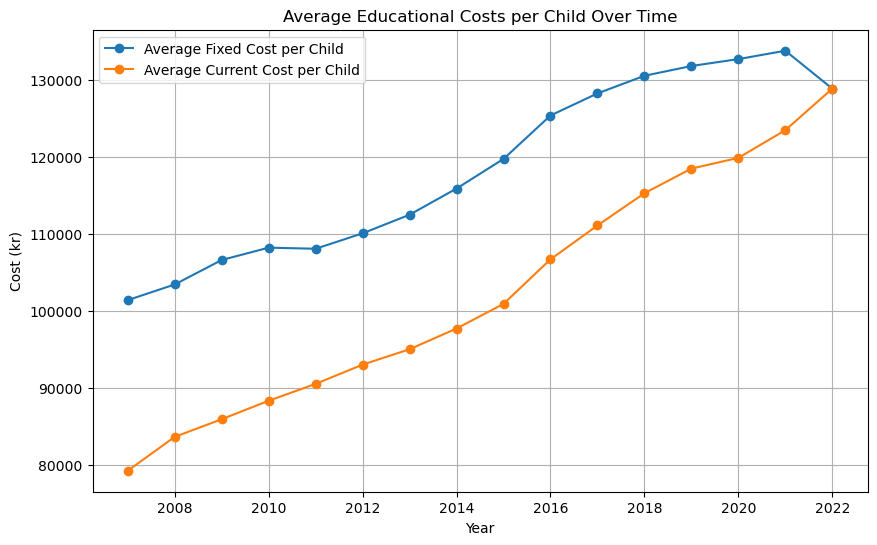

In [15]:
import sqlite3
import matplotlib.pyplot as plt

# Connect to the SQLite database
conn = sqlite3.connect('education_costs.db')

# Execute SQL query to get average educational costs per child by year
query = '''
SELECT year, 
       AVG(Fixed_cost_per_child_kr) AS avg_fixed_cost_per_child, 
       AVG(Current_cost_per_child_kr) AS avg_current_cost_per_child
FROM grundskola_costs_per_child
GROUP BY year;
'''

cursor = conn.cursor()
cursor.execute(query)
data = cursor.fetchall()

# Close the connection
conn.close()

# Process data for plotting
years = [row[0] for row in data]
avg_fixed_cost = [row[1] for row in data]
avg_current_cost = [row[2] for row in data]

# Plot the data
plt.figure(figsize=(10, 6))
plt.plot(years, avg_fixed_cost, label='Average Fixed Cost per Child', marker='o')
plt.plot(years, avg_current_cost, label='Average Current Cost per Child', marker='o')
plt.xlabel('Year')
plt.ylabel('Cost (kr)')
plt.title('Average Educational Costs per Child Over Time')
plt.legend()
plt.grid(True)
plt.show()


In [16]:
import sqlite3

# Connect to the SQLite database
conn = sqlite3.connect('education_costs.db')

# Execute the SQL query to combine population data for ages 0-16 and 17-19 with average educational costs
query = '''
SELECT p.region, p.year, 
       p.population AS population_0_16, 
       pop17_19.population AS population_17_19,
       AVG(g.Fixed_cost_per_child_kr) AS avg_fixed_cost_per_child, 
       AVG(g.Current_cost_per_child_kr) AS avg_current_cost_per_child
FROM scb_region_population_0_16_years AS p
JOIN scb_region_population_17_19_years AS pop17_19
ON p.region = pop17_19.region AND p.year = pop17_19.year
JOIN grundskola_costs_per_child AS g
ON p.year = g.year
GROUP BY p.region, p.year;
'''

cursor = conn.cursor()
cursor.execute(query)
rows = cursor.fetchall()

# Display the results
for row in rows:
    print(row)

# Close the connection
conn.close()


(1, 2007, 27342, 23561, 101392.0, 79200.0)
(1, 2008, 27908, 24528, 103429.0, 83600.0)
(1, 2009, 28527, 25798, 106611.0, 85900.0)
(1, 2010, 29578, 25633, 108217.0, 88300.0)
(1, 2011, 28583, 25478, 108075.0, 90500.0)
(1, 2012, 28886, 23855, 110081.0, 93000.0)
(1, 2013, 29512, 22930, 112499.0, 95000.0)
(1, 2014, 29607, 22298, 115907.0, 97700.0)
(1, 2015, 29430, 22691, 119756.0, 100900.0)
(1, 2016, 29626, 22822, 125408.0, 106700.0)
(1, 2017, 28938, 23563, 128281.0, 111100.0)
(1, 2018, 28798, 24653, 130576.0, 115300.0)
(1, 2019, 28474, 24971, 131847.0, 118500.0)
(1, 2020, 28384, 24692, 132746.0, 119900.0)
(1, 2021, 28880, 25959, 133835.0, 123500.0)
(1, 2022, 26271, 26983, 128900.0, 128900.0)
(3, 2007, 3857, 4521, 101392.0, 79200.0)
(3, 2008, 4091, 4745, 103429.0, 83600.0)
(3, 2009, 3985, 4668, 106611.0, 85900.0)
(3, 2010, 4157, 4379, 108217.0, 88300.0)
(3, 2011, 3978, 4430, 108075.0, 90500.0)
(3, 2012, 4110, 4141, 110081.0, 93000.0)
(3, 2013, 3943, 3766, 112499.0, 95000.0)
(3, 2014, 4064, 3

In [18]:
import pandas as pd

# Load the CSV files
grundskola_costs_path = "C:/Users/theop/Downloads/grundskola_costs_per_child.csv"
gymnasieskola_costs_path = "C:/Users/theop/Downloads/gymnasieskola_costs_per_child.csv"

grundskola_df = pd.read_csv(grundskola_costs_path)
gymnasieskola_df = pd.read_csv(gymnasieskola_costs_path)

# Display the first 5 rows to check the columns
print("Columns in the 'grundskola_costs_per_child' table:", grundskola_df.columns)
print(grundskola_df.head())

print("Columns in the 'gymnasieskola_costs_per_child' table:", gymnasieskola_df.columns)
print(gymnasieskola_df.head())


Columns in the 'grundskola_costs_per_child' table: Index(['Year', 'Fixed_cost_per_child_kr', 'Current_cost_per_child_kr'], dtype='object')
   Year  Fixed_cost_per_child_kr  Current_cost_per_child_kr
0  2007                   101392                      79200
1  2008                   103429                      83600
2  2009                   106611                      85900
3  2010                   108217                      88300
4  2011                   108075                      90500
Columns in the 'gymnasieskola_costs_per_child' table: Index(['Year', 'Fixed_cost_per_child_kr', 'Current_cost_per_child_kr'], dtype='object')
   Year  Fixed_cost_per_child_kr  Current_cost_per_child_kr
0  2007                   113809                      88900
1  2008                   114316                      92400
2  2009                   116416                      93800
3  2010                   117532                      95900
4  2011                   119539                     100100

In [19]:
import sqlite3

# Connect to the SQLite database
conn = sqlite3.connect('education_costs.db')

# Query to display all data from the 'grundskola_costs_per_child' table
query = '''
SELECT *
FROM grundskola_costs_per_child;
'''

cursor = conn.cursor()
cursor.execute(query)
rows = cursor.fetchall()

# Display the results
for row in rows:
    print(row)

# Close the connection
conn.close()


(2007, 101392, 79200)
(2008, 103429, 83600)
(2009, 106611, 85900)
(2010, 108217, 88300)
(2011, 108075, 90500)
(2012, 110081, 93000)
(2013, 112499, 95000)
(2014, 115907, 97700)
(2015, 119756, 100900)
(2016, 125408, 106700)
(2017, 128281, 111100)
(2018, 130576, 115300)
(2019, 131847, 118500)
(2020, 132746, 119900)
(2021, 133835, 123500)
(2022, 128900, 128900)


In [20]:
import sqlite3

# Connect to the SQLite database
conn = sqlite3.connect('education_costs.db')

# Query to display all data from the 'gymnasieskola_costs_per_child' table
query = '''
SELECT *
FROM gymnasieskola_costs_per_child;
'''

cursor = conn.cursor()
cursor.execute(query)
rows = cursor.fetchall()

# Display the results
for row in rows:
    print(row)

# Close the connection
conn.close()


(2007, 113809, 88900)
(2008, 114316, 92400)
(2009, 116416, 93800)
(2010, 117532, 95900)
(2011, 119539, 100100)
(2012, 122984, 103900)
(2013, 130144, 109900)
(2014, 133346, 112400)
(2015, 136373, 114900)
(2016, 141157, 120100)
(2017, 143522, 124300)
(2018, 142694, 126000)
(2019, 140526, 126300)
(2020, 140717, 127100)
(2021, 140120, 129300)
(2022, 135100, 135100)


In [21]:
import pandas as pd
import sqlite3

# Load the CSV files
grundskola_costs_path = "C:/Users/theop/Downloads/grundskola_costs_per_child.csv"
gymnasieskola_costs_path = "C:/Users/theop/Downloads/gymnasieskola_costs_per_child.csv"

grundskola_df = pd.read_csv(grundskola_costs_path)
gymnasieskola_df = pd.read_csv(gymnasieskola_costs_path)

# Clean the data
grundskola_df['Year'] = grundskola_df['Year'].astype(str).str.replace(r'\D', '', regex=True)
grundskola_df['Fixed_cost_per_child_kr'] = grundskola_df['Fixed_cost_per_child_kr'].astype(str).str.replace(r'\s+', '', regex=True)
grundskola_df['Current_cost_per_child_kr'] = grundskola_df['Current_cost_per_child_kr'].astype(str).str.replace(r'\s+', '', regex=True)

gymnasieskola_df['Year'] = gymnasieskola_df['Year'].astype(str).str.replace(r'\D', '', regex=True)
gymnasieskola_df['Fixed_cost_per_child_kr'] = gymnasieskola_df['Fixed_cost_per_child_kr'].astype(str).str.replace(r'\s+', '', regex=True)
gymnasieskola_df['Current_cost_per_child_kr'] = gymnasieskola_df['Current_cost_per_child_kr'].astype(str).str.replace(r'\s+', '', regex=True)

# Connect to the SQLite database
conn = sqlite3.connect('education_costs.db')

# Insert the cleaned data into the SQL database
grundskola_df.to_sql('grundskola_costs_per_child', conn, if_exists='replace', index=False)
gymnasieskola_df.to_sql('gymnasieskola_costs_per_child', conn, if_exists='replace', index=False)

# Close the connection
conn.close()

print("The cleaned data has been successfully imported into the database.")


The cleaned data has been successfully imported into the database.


In [23]:
import sqlite3

# Connect to the SQLite database
conn = sqlite3.connect('education_costs.db')

# Execute query to fetch the first 10 records from grundskola_costs_per_child
query = '''
SELECT *
FROM grundskola_costs_per_child
LIMIT 10;
'''

cursor = conn.cursor()
cursor.execute(query)
rows = cursor.fetchall()

# Display the results
for row in rows:
    print(row)

# Close the connection
conn.close()


('2007', '101392', '79200')
('2008', '103429', '83600')
('2009', '106611', '85900')
('2010', '108217', '88300')
('2011', '108075', '90500')
('2012', '110081', '93000')
('2013', '112499', '95000')
('2014', '115907', '97700')
('2015', '119756', '100900')
('2016', '125408', '106700')


In [24]:
import sqlite3

# Connect to the SQLite database
conn = sqlite3.connect('education_costs.db')

# Execute query to fetch the first 10 records from gymnasieskola_costs_per_child
query = '''
SELECT *
FROM gymnasieskola_costs_per_child
LIMIT 10;
'''

cursor = conn.cursor()
cursor.execute(query)
rows = cursor.fetchall()

# Display the results
for row in rows:
    print(row)

# Close the connection
conn.close()


('2007', '113809', '88900')
('2008', '114316', '92400')
('2009', '116416', '93800')
('2010', '117532', '95900')
('2011', '119539', '100100')
('2012', '122984', '103900')
('2013', '130144', '109900')
('2014', '133346', '112400')
('2015', '136373', '114900')
('2016', '141157', '120100')


In [25]:
import sqlite3

# Connect to the SQLite database
conn = sqlite3.connect('education_costs.db')

# Query for combined analysis of population and cost for age 0-16
query = '''
SELECT p.region, p.year, p.population AS population_0_16, g.Fixed_cost_per_child_kr, g.Current_cost_per_child_kr
FROM scb_region_population_0_16_years AS p
JOIN grundskola_costs_per_child AS g
ON p.year = g.Year;
'''

cursor = conn.cursor()
cursor.execute(query)
rows = cursor.fetchall()

# Display the results
for row in rows:
    print(row)

# Close the connection
conn.close()


(1, 2007, 20423, '101392', '79200')
(1, 2007, 20464, '101392', '79200')
(1, 2007, 20585, '101392', '79200')
(1, 2007, 21278, '101392', '79200')
(1, 2007, 21439, '101392', '79200')
(1, 2007, 22071, '101392', '79200')
(1, 2007, 22450, '101392', '79200')
(1, 2007, 23548, '101392', '79200')
(1, 2007, 24273, '101392', '79200')
(1, 2007, 24634, '101392', '79200')
(1, 2007, 24740, '101392', '79200')
(1, 2007, 25132, '101392', '79200')
(1, 2007, 25461, '101392', '79200')
(1, 2007, 25618, '101392', '79200')
(1, 2007, 25841, '101392', '79200')
(1, 2007, 27011, '101392', '79200')
(1, 2007, 27342, '101392', '79200')
(3, 2007, 3236, '101392', '79200')
(3, 2007, 3368, '101392', '79200')
(3, 2007, 3385, '101392', '79200')
(3, 2007, 3454, '101392', '79200')
(3, 2007, 3491, '101392', '79200')
(3, 2007, 3573, '101392', '79200')
(3, 2007, 3601, '101392', '79200')
(3, 2007, 3675, '101392', '79200')
(3, 2007, 3692, '101392', '79200')
(3, 2007, 3857, '101392', '79200')
(3, 2007, 3864, '101392', '79200')
(3,

In [27]:
import sqlite3

# Connect to the SQLite database
conn = sqlite3.connect('education_costs.db')

# Query to retrieve population and educational costs for age 17-19
query = '''
SELECT p.region, p.year, p.population AS population_17_19, g.Fixed_cost_per_child_kr, g.Current_cost_per_child_kr
FROM scb_region_population_17_19_years AS p
JOIN gymnasieskola_costs_per_child AS g
ON p.year = g.Year;
'''

cursor = conn.cursor()
cursor.execute(query)
rows = cursor.fetchall()

# Display the results
for row in rows:
    print(row)

# Close the connection
conn.close()


(1, 2007, 23561, '113809', '88900')
(1, 2007, 24162, '113809', '88900')
(1, 2007, 25625, '113809', '88900')
(3, 2007, 4521, '113809', '88900')
(3, 2007, 4572, '113809', '88900')
(3, 2007, 4696, '113809', '88900')
(4, 2007, 3495, '113809', '88900')
(4, 2007, 3912, '113809', '88900')
(4, 2007, 4064, '113809', '88900')
(5, 2007, 5705, '113809', '88900')
(5, 2007, 6052, '113809', '88900')
(5, 2007, 6245, '113809', '88900')
(6, 2007, 4839, '113809', '88900')
(6, 2007, 4912, '113809', '88900')
(6, 2007, 5207, '113809', '88900')
(7, 2007, 2465, '113809', '88900')
(7, 2007, 2553, '113809', '88900')
(7, 2007, 2667, '113809', '88900')
(8, 2007, 3174, '113809', '88900')
(8, 2007, 3392, '113809', '88900')
(8, 2007, 3619, '113809', '88900')
(9, 2007, 867, '113809', '88900')
(9, 2007, 904, '113809', '88900')
(9, 2007, 1002, '113809', '88900')
(10, 2007, 1906, '113809', '88900')
(10, 2007, 1999, '113809', '88900')
(10, 2007, 2186, '113809', '88900')
(12, 2007, 15791, '113809', '88900')
(12, 2007, 158

In [30]:
import sqlite3
import pandas as pd
import matplotlib.pyplot as plt

# Connect to the SQLite database
conn = sqlite3.connect('education_costs.db')

# Query to retrieve data for population 17-19 and associated educational costs
query = '''
SELECT p.region, p.year, p.population AS population_17_19, 
       g.Fixed_cost_per_child_kr, g.Current_cost_per_child_kr
FROM scb_region_population_17_19_years AS p
JOIN gymnasieskola_costs_per_child AS g
ON p.year = g.Year;
'''

# Load query results into a DataFrame
df = pd.read_sql_query(query, conn)

# Close the connection
conn.close()

# Print the columns to check their names
print("Columns in DataFrame:", df.columns)

# Convert cost columns to numeric (if not already)
df['Fixed_cost_per_child_kr'] = pd.to_numeric(df['Fixed_cost_per_child_kr'], errors='coerce')
df['Current_cost_per_child_kr'] = pd.to_numeric(df['Current_cost_per_child_kr'], errors='coerce')

# If 'year' column exists, proceed with the plot; if not, adjust accordingly
if 'year' in df.columns:
    plt.figure(figsize=(12, 6))

    # Plot population
    plt.plot(df['year'], df['population_17_19'], label='Population 17-19', color='blue', marker='o')
    # Plot fixed cost per child
    plt.plot(df['year'], df['Fixed_cost_per_child_kr'], label='Fixed Cost per Child (Gymnasieskola)', color='green', marker='x')
    # Plot current cost per child
    plt.plot(df['year'], df['Current_cost_per_child_kr'], label='Current Cost per Child (Gymnasieskola)', color='red', marker='s')

    # Adding labels and title
    plt.xlabel('Year')
    plt.ylabel('Value')
    plt.title('Population 17-19 and Educational Costs per Child (Gymnasieskola) Over Years')
    plt.legend()
    plt.grid(True)
    plt.show()
else:
    print("The 'year' column does not exist in the DataFrame. Please check the column names.")


Columns in DataFrame: Index(['Region', 'Year', 'population_17_19', 'Fixed_cost_per_child_kr',
       'Current_cost_per_child_kr'],
      dtype='object')
The 'year' column does not exist in the DataFrame. Please check the column names.


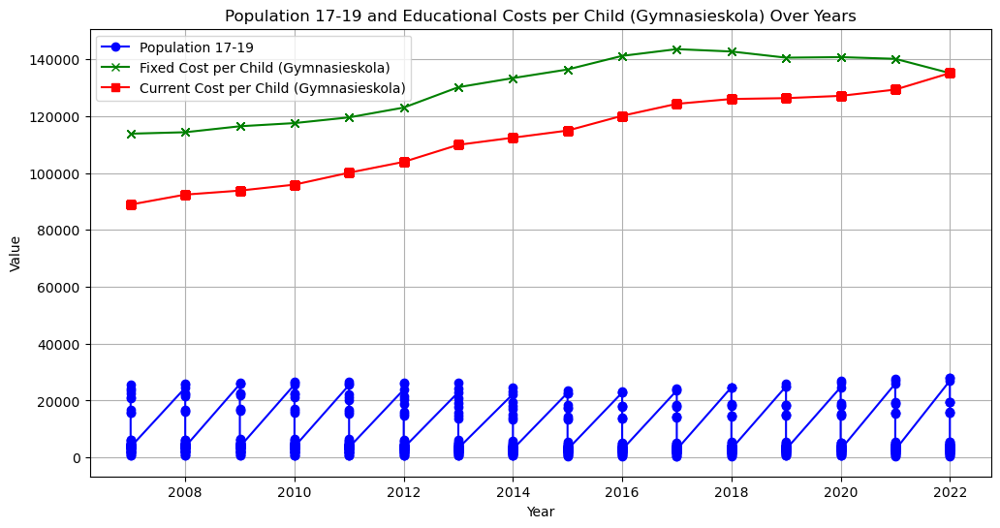

In [31]:
import sqlite3
import pandas as pd
import matplotlib.pyplot as plt

# Connection with database SQLite
conn = sqlite3.connect('education_costs.db')

# SQL query for the population 17-19 years old and the average cost
query = '''
SELECT p.region, p.year, p.population AS population_17_19, 
       g.Fixed_cost_per_child_kr, g.Current_cost_per_child_kr
FROM scb_region_population_17_19_years AS p
JOIN gymnasieskola_costs_per_child AS g
ON p.year = g.Year;
'''

# Results in a DataFrame
df = pd.read_sql_query(query, conn)

# Close the connection
conn.close()

df['Fixed_cost_per_child_kr'] = pd.to_numeric(df['Fixed_cost_per_child_kr'], errors='coerce')
df['Current_cost_per_child_kr'] = pd.to_numeric(df['Current_cost_per_child_kr'], errors='coerce')


plt.figure(figsize=(12, 6))

# Plot for the population 17-19 years old
plt.plot(df['Year'], df['population_17_19'], label='Population 17-19', color='blue', marker='o')
# Plot for the fixed cost per child
plt.plot(df['Year'], df['Fixed_cost_per_child_kr'], label='Fixed Cost per Child (Gymnasieskola)', color='green', marker='x')
# Plot for the current cost per child
plt.plot(df['Year'], df['Current_cost_per_child_kr'], label='Current Cost per Child (Gymnasieskola)', color='red', marker='s')

plt.xlabel('Year')
plt.ylabel('Value')
plt.title('Population 17-19 and Educational Costs per Child (Gymnasieskola) Over Years')
plt.legend()
plt.grid(True)
plt.show()


In [34]:
# Display name of columns in the DataFrame
print("Columns in DataFrame:", df.columns)


Columns in DataFrame: Index(['Region', 'Year', 'population_0_16', 'Fixed_cost_per_child_kr',
       'Current_cost_per_child_kr'],
      dtype='object')


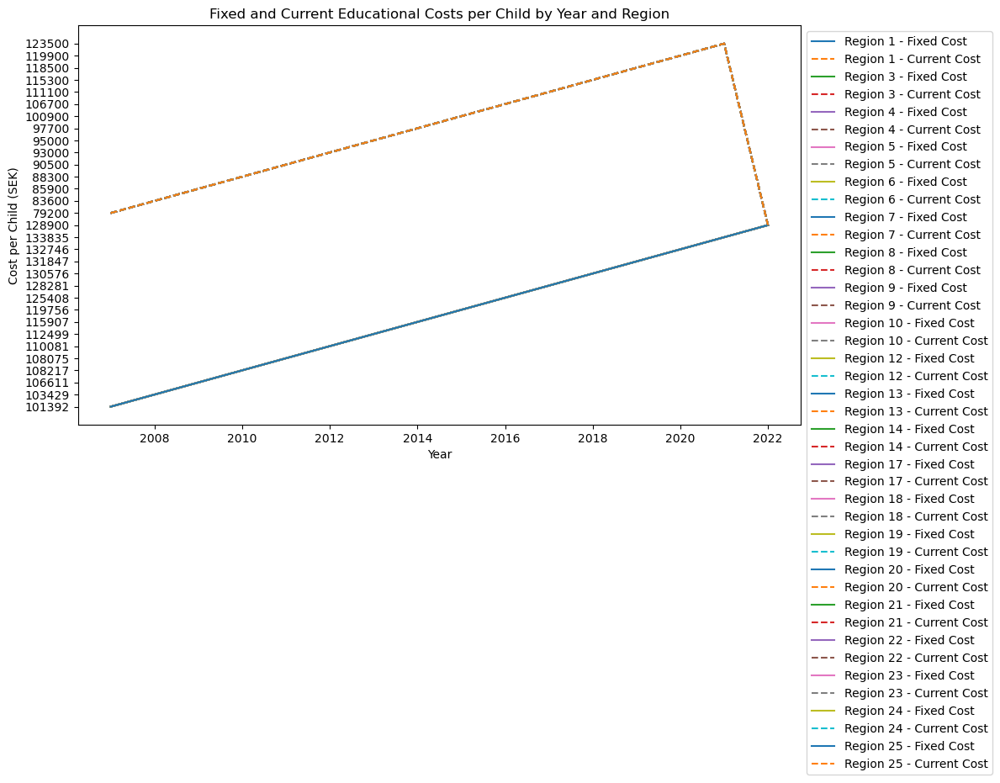

In [35]:
import sqlite3
import pandas as pd
import matplotlib.pyplot as plt

# Connect to the SQLite database
conn = sqlite3.connect('education_costs.db')

# SQL query to retrieve data for population 0-16 and associated educational costs
query = '''
SELECT p.Region, p.Year, p.population AS population_0_16, 
       g.Fixed_cost_per_child_kr, g.Current_cost_per_child_kr
FROM scb_region_population_0_16_years AS p
JOIN grundskola_costs_per_child AS g
ON p.Year = g.Year;
'''

# Load the data into a DataFrame
df = pd.read_sql_query(query, conn)

# Close the connection
conn.close()

# Ensure the 'Year' column is numeric for accurate plotting
df['Year'] = pd.to_numeric(df['Year'], errors='coerce')

# Plotting fixed and current cost per child over the years for each region
plt.figure(figsize=(12, 8))

for region in df['Region'].unique():
    region_data = df[df['Region'] == region]
    plt.plot(region_data['Year'], region_data['Fixed_cost_per_child_kr'], label=f'Region {region} - Fixed Cost')
    plt.plot(region_data['Year'], region_data['Current_cost_per_child_kr'], label=f'Region {region} - Current Cost', linestyle='--')

# Add labels and title
plt.xlabel('Year')
plt.ylabel('Cost per Child (SEK)')
plt.title('Fixed and Current Educational Costs per Child by Year and Region')
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.tight_layout()
plt.show()


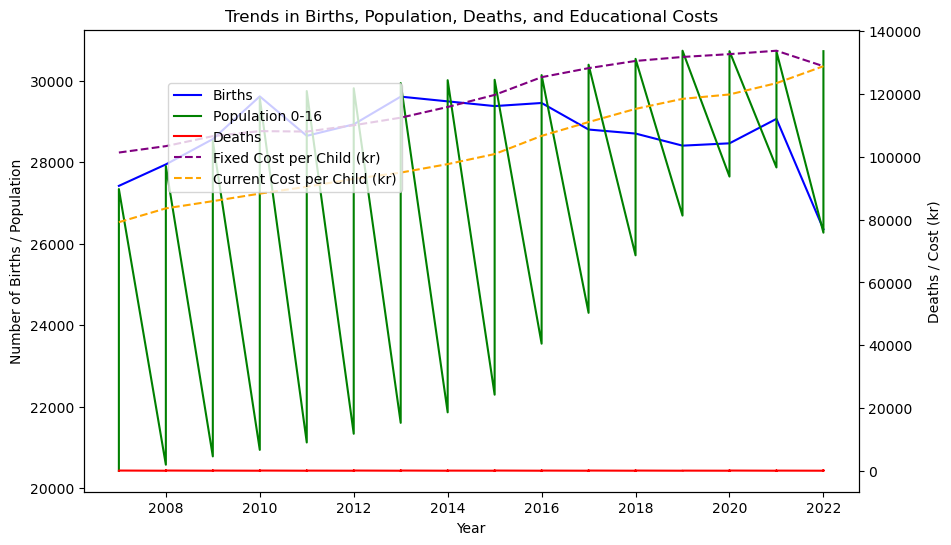

In [36]:
import sqlite3
import pandas as pd
import matplotlib.pyplot as plt

# Connect to the SQLite database
conn = sqlite3.connect('education_costs.db')

# Execute the query and load the data into a DataFrame
query = '''
SELECT b.Region, b.Year, b.Number AS Births, 
       p.population AS Population_0_16, 
       d.Number AS Deaths, 
       g.Fixed_cost_per_child_kr, g.Current_cost_per_child_kr
FROM scb_region_birth_data AS b
JOIN scb_region_population_0_16_years AS p
ON b.Region = p.Region AND b.Year = p.Year
JOIN scb_dead_region AS d
ON b.Region = d.Region AND b.Year = d.Year
JOIN grundskola_costs_per_child AS g
ON b.Year = g.Year
WHERE b.Region = 1; -- Change the region number here if needed
'''

# Load the data into a DataFrame
df = pd.read_sql_query(query, conn)
conn.close()

# Convert relevant columns to numeric, if needed, for plotting
df['Year'] = pd.to_numeric(df['Year'], errors='coerce')
df['Population_0_16'] = pd.to_numeric(df['Population_0_16'], errors='coerce')
df['Births'] = pd.to_numeric(df['Births'], errors='coerce')
df['Deaths'] = pd.to_numeric(df['Deaths'], errors='coerce')
df['Fixed_cost_per_child_kr'] = pd.to_numeric(df['Fixed_cost_per_child_kr'], errors='coerce')
df['Current_cost_per_child_kr'] = pd.to_numeric(df['Current_cost_per_child_kr'], errors='coerce')

# Plotting
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plot births and population on the primary y-axis
ax1.plot(df['Year'], df['Births'], label='Births', color='b')
ax1.plot(df['Year'], df['Population_0_16'], label='Population 0-16', color='g')
ax1.set_xlabel('Year')
ax1.set_ylabel('Number of Births / Population', color='k')
ax1.tick_params(axis='y')

# Create a second y-axis for deaths and costs
ax2 = ax1.twinx()
ax2.plot(df['Year'], df['Deaths'], label='Deaths', color='r')
ax2.plot(df['Year'], df['Fixed_cost_per_child_kr'], label='Fixed Cost per Child (kr)', linestyle='--', color='purple')
ax2.plot(df['Year'], df['Current_cost_per_child_kr'], label='Current Cost per Child (kr)', linestyle='--', color='orange')
ax2.set_ylabel('Deaths / Cost (kr)', color='k')
ax2.tick_params(axis='y')

# Add legends
fig.legend(loc="upper left", bbox_to_anchor=(0.1,0.9), bbox_transform=ax1.transAxes)
plt.title('Trends in Births, Population, Deaths, and Educational Costs')
plt.show()


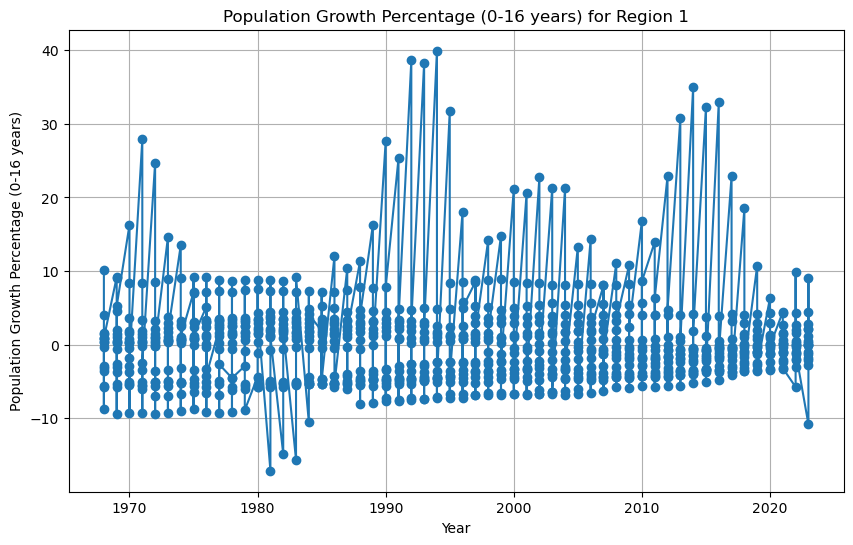

In [38]:
import sqlite3
import pandas as pd
import matplotlib.pyplot as plt

# Connect to the SQLite database
conn = sqlite3.connect('education_costs.db')

# Execute SQL query for percentage growth calculation
query = '''
SELECT Region, Year, 
       population AS population_0_16, 
       LAG(population, 1) OVER (PARTITION BY Region ORDER BY Year) AS prev_population,
       ((population - LAG(population, 1) OVER (PARTITION BY Region ORDER BY Year)) * 100.0 / LAG(population, 1) OVER (PARTITION BY Region ORDER BY Year)) AS population_growth_percentage
FROM scb_region_population_0_16_years;
'''

# Load the data into a DataFrame
df = pd.read_sql_query(query, conn)
conn.close()

# Check column names and convert types if necessary
df['Year'] = pd.to_numeric(df['Year'], errors='coerce')
df['population_growth_percentage'] = pd.to_numeric(df['population_growth_percentage'], errors='coerce')

# Filter data for a specific region
region_id = 1  # Change this ID for other regions if needed
df_region = df[df['Region'] == region_id]

# Visualize the population growth percentage
plt.figure(figsize=(10, 6))
plt.plot(df_region['Year'], df_region['population_growth_percentage'], marker='o')
plt.xlabel('Year')
plt.ylabel('Population Growth Percentage (0-16 years)')
plt.title(f'Population Growth Percentage (0-16 years) for Region {region_id}')
plt.grid()
plt.show()


In [39]:
import sqlite3

# Connect to the SQLite database
conn = sqlite3.connect('education_costs.db')

# Query to calculate the percentage change in the population aged 0-16
query = '''
SELECT p.region, p.year, p.population AS population_0_16, 
       LAG(p.population) OVER (PARTITION BY p.region ORDER BY p.year) AS prev_population,
       100.0 * (p.population - LAG(p.population) OVER (PARTITION BY p.region ORDER BY p.year)) / LAG(p.population) OVER (PARTITION BY p.region ORDER BY p.year) AS percentage_change
FROM scb_region_population_0_16_years AS p;
'''

cursor = conn.cursor()
cursor.execute(query)
rows = cursor.fetchall()

# Display results
for row in rows:
    print(row)

# Close the connection
conn.close()


(1, 1968, 19736, None, None)
(1, 1968, 21741, 19736, 10.159100121605189)
(1, 1968, 21824, 21741, 0.38176716802355)
(1, 1968, 22001, 21824, 0.811033724340176)
(1, 1968, 22342, 22001, 1.5499295486568792)
(1, 1968, 20382, 22342, -8.772715065795364)
(1, 1968, 19248, 20382, -5.56373270532823)
(1, 1968, 18569, 19248, -3.5276392352452204)
(1, 1968, 17501, 18569, -5.751521352792288)
(1, 1968, 17565, 17501, 0.3656933889492029)
(1, 1968, 17734, 17565, 0.9621406205522346)
(1, 1968, 17994, 17734, 1.4661102966053907)
(1, 1968, 17948, 17994, -0.2556407691452706)
(1, 1968, 17390, 17948, -3.1089815021172273)
(1, 1968, 16883, 17390, -2.9154686601495112)
(1, 1968, 17572, 16883, 4.081028253272523)
(1, 1968, 17725, 17572, 0.8707033917596175)
(1, 1969, 19351, 17725, 9.173483779971791)
(1, 1969, 20242, 19351, 4.604413208619709)
(1, 1969, 22071, 20242, 9.035668412212232)
(1, 1969, 22125, 22071, 0.24466494495038738)
(1, 1969, 22228, 22125, 0.4655367231638418)
(1, 1969, 22668, 22228, 1.9794853338132086)
(1, 19

In [41]:
import sqlite3
import pandas as pd

# Connect to the SQLite database
conn = sqlite3.connect('education_costs.db')

# Execute the query and check column names
query = '''
SELECT p.region, p.year, p.population AS population_0_16, 
       LAG(p.population) OVER (PARTITION BY p.region ORDER BY p.year) AS prev_population,
       100.0 * (p.population - LAG(p.population) OVER (PARTITION BY p.region ORDER BY p.year)) / LAG(p.population) OVER (PARTITION BY p.region ORDER BY p.year) AS percentage_change
FROM scb_region_population_0_16_years AS p;
'''

# Load the data into a DataFrame
df = pd.read_sql_query(query, conn)

# Close the database connection
conn.close()

# Print the columns
print("Columns in DataFrame:", df.columns)
print(df.head())


Columns in DataFrame: Index(['Region', 'Year', 'population_0_16', 'prev_population',
       'percentage_change'],
      dtype='object')
   Region  Year  population_0_16  prev_population  percentage_change
0       1  1968            19736              NaN                NaN
1       1  1968            21741          19736.0          10.159100
2       1  1968            21824          21741.0           0.381767
3       1  1968            22001          21824.0           0.811034
4       1  1968            22342          22001.0           1.549930


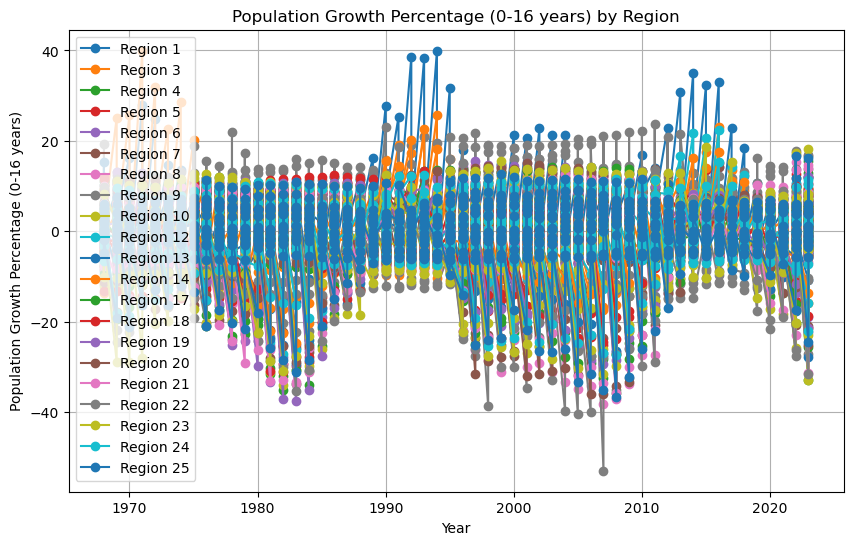

In [42]:
import matplotlib.pyplot as plt
import pandas as pd
import sqlite3

# Connect to the SQLite database
conn = sqlite3.connect('education_costs.db')

# Query to fetch data
query = '''
SELECT p.region, p.year, p.population AS population_0_16, 
       LAG(p.population) OVER (PARTITION BY p.region ORDER BY p.year) AS prev_population,
       100.0 * (p.population - LAG(p.population) OVER (PARTITION BY p.region ORDER BY p.year)) / LAG(p.population) OVER (PARTITION BY p.region ORDER BY p.year) AS percentage_change
FROM scb_region_population_0_16_years AS p;
'''

# Load data into DataFrame
df = pd.read_sql_query(query, conn)

# Close the database connection
conn.close()

# Convert columns to numeric if necessary
df['Year'] = pd.to_numeric(df['Year'], errors='coerce')
df['percentage_change'] = pd.to_numeric(df['percentage_change'], errors='coerce')

# Plotting percentage change for each region
plt.figure(figsize=(10, 6))

# Plot percentage change for each unique region
for region in df['Region'].unique():
    region_data = df[df['Region'] == region]
    plt.plot(region_data['Year'], region_data['percentage_change'], marker='o', label=f'Region {region}')

# Adding labels and title
plt.xlabel('Year')
plt.ylabel('Population Growth Percentage (0-16 years)')
plt.title('Population Growth Percentage (0-16 years) by Region')
plt.legend()
plt.grid(True)

# Show the plot
plt.show()


In [43]:
import sqlite3

# Connect to the SQLite database
conn = sqlite3.connect('education_costs.db')

# Query to calculate percentage change in the population for ages 17-19
query = '''
SELECT p.region, p.year, p.population AS population_17_19, 
       LAG(p.population) OVER (PARTITION BY p.region ORDER BY p.year) AS prev_population,
       100.0 * (p.population - LAG(p.population) OVER (PARTITION BY p.region ORDER BY p.year)) / LAG(p.population) OVER (PARTITION BY p.region ORDER BY p.year) AS percentage_change
FROM scb_region_population_17_19_years AS p;
'''

cursor = conn.cursor()
cursor.execute(query)
rows = cursor.fetchall()

# Display results
for row in rows:
    print(row)

# Close the connection
conn.close()


(1, 1968, 17725, None, None)
(1, 1968, 19053, 17725, 7.492242595204513)
(1, 1968, 21139, 19053, 10.948407075001311)
(1, 1969, 18325, 21139, -13.311887979563839)
(1, 1969, 18711, 18325, 2.106412005457026)
(1, 1969, 20354, 18711, 8.780931003153226)
(1, 1970, 18404, 20354, -9.580426451803085)
(1, 1970, 19214, 18404, 4.401217126711584)
(1, 1970, 20059, 19214, 4.397834912043302)
(1, 1971, 17493, 20059, -12.792262824667231)
(1, 1971, 18798, 17493, 7.4601269079060195)
(1, 1971, 19846, 18798, 5.5750611767209275)
(1, 1972, 17830, 19846, -10.158218280761867)
(1, 1972, 17801, 17830, -0.16264722378014582)
(1, 1972, 19272, 17801, 8.263580697713612)
(1, 1973, 18242, 19272, -5.344541303445413)
(1, 1973, 18160, 18242, -0.44951211489968207)
(1, 1973, 18271, 18160, 0.6112334801762115)
(1, 1974, 18218, 18271, -0.2900771714739204)
(1, 1974, 18599, 18218, 2.091338236908552)
(1, 1974, 18820, 18599, 1.1882359266627238)
(1, 1975, 17944, 18820, -4.654622741764081)
(1, 1975, 18694, 17944, 4.17967008470798)
(1, 

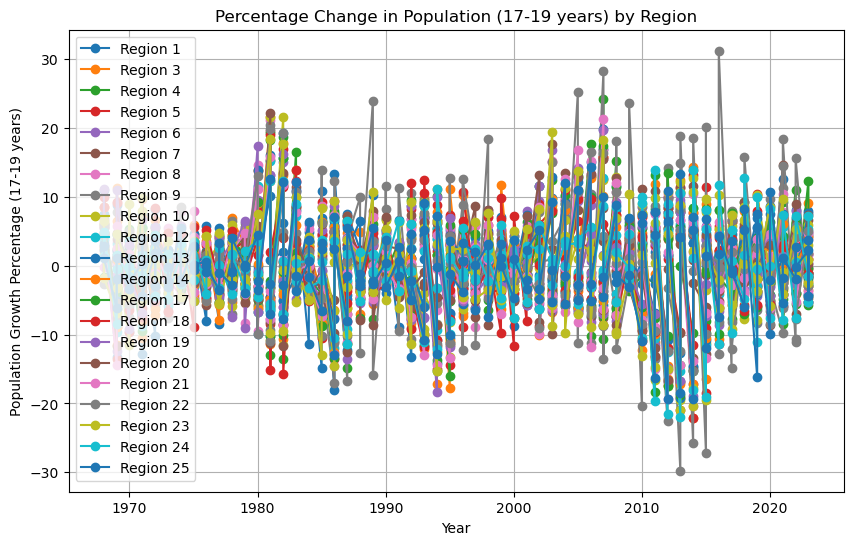

In [45]:
import sqlite3
import pandas as pd
import matplotlib.pyplot as plt

# Connect to the SQLite database
conn = sqlite3.connect('education_costs.db')

# Execute the query and load the data into a DataFrame
query = '''
SELECT p.region AS Region, p.year AS Year, p.population AS population_17_19, 
       LAG(p.population) OVER (PARTITION BY p.region ORDER BY p.year) AS prev_population,
       100.0 * (p.population - LAG(p.population) OVER (PARTITION BY p.region ORDER BY p.year)) / LAG(p.population) OVER (PARTITION BY p.region ORDER BY p.year) AS percentage_change
FROM scb_region_population_17_19_years AS p;
'''

df = pd.read_sql_query(query, conn)
conn.close()

# Convert columns to numeric if necessary
df['Year'] = pd.to_numeric(df['Year'], errors='coerce')
df['percentage_change'] = pd.to_numeric(df['percentage_change'], errors='coerce')

# Plotting percentage change for each region
plt.figure(figsize=(10, 6))

# Plotting percentage change per year for each region
for region in df['Region'].unique():
    region_data = df[df['Region'] == region]
    plt.plot(region_data['Year'], region_data['percentage_change'], marker='o', label=f'Region {region}')

# Adding labels and title
plt.xlabel('Year')
plt.ylabel('Population Growth Percentage (17-19 years)')
plt.title('Percentage Change in Population (17-19 years) by Region')
plt.legend()
plt.grid(True)

# Display the plot
plt.show()


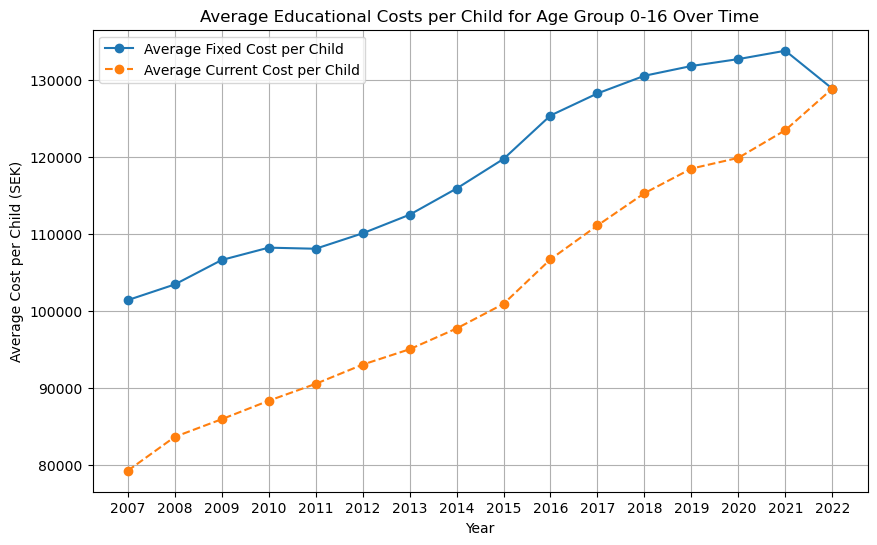

In [46]:
import sqlite3
import pandas as pd
import matplotlib.pyplot as plt

# Connect to SQLite database
conn = sqlite3.connect('education_costs.db')

# Query to calculate average educational costs per child for age group 0-16
query = '''
SELECT g.Year, 
       AVG(CAST(g.Fixed_cost_per_child_kr AS INTEGER)) AS avg_fixed_cost_per_child,
       AVG(CAST(g.Current_cost_per_child_kr AS INTEGER)) AS avg_current_cost_per_child
FROM grundskola_costs_per_child AS g
GROUP BY g.Year;
'''

# Load data into DataFrame for visualization
df = pd.read_sql_query(query, conn)
conn.close()

# Plotting the average educational costs over the years
plt.figure(figsize=(10, 6))

# Plotting fixed and current cost per child
plt.plot(df['Year'], df['avg_fixed_cost_per_child'], marker='o', label='Average Fixed Cost per Child')
plt.plot(df['Year'], df['avg_current_cost_per_child'], marker='o', linestyle='--', label='Average Current Cost per Child')

# Adding labels, title, and legend
plt.xlabel('Year')
plt.ylabel('Average Cost per Child (SEK)')
plt.title('Average Educational Costs per Child for Age Group 0-16 Over Time')
plt.legend()
plt.grid(True)

# Display plot
plt.show()


In [48]:
import sqlite3

# Connect to the SQLite database
conn = sqlite3.connect('education_costs.db')

# Query to calculate the average educational costs per child for the age group 0-16
query = '''
SELECT g.Year, 
       AVG(CAST(g.Fixed_cost_per_child_kr AS INTEGER)) AS avg_fixed_cost_per_child,
       AVG(CAST(g.Current_cost_per_child_kr AS INTEGER)) AS avg_current_cost_per_child
FROM grundskola_costs_per_child AS g
GROUP BY g.Year;
'''

cursor = conn.cursor()
cursor.execute(query)
rows = cursor.fetchall()

# Display the results
for row in rows:
    print(row)

# Close the connection
conn.close()


('2007', 101392.0, 79200.0)
('2008', 103429.0, 83600.0)
('2009', 106611.0, 85900.0)
('2010', 108217.0, 88300.0)
('2011', 108075.0, 90500.0)
('2012', 110081.0, 93000.0)
('2013', 112499.0, 95000.0)
('2014', 115907.0, 97700.0)
('2015', 119756.0, 100900.0)
('2016', 125408.0, 106700.0)
('2017', 128281.0, 111100.0)
('2018', 130576.0, 115300.0)
('2019', 131847.0, 118500.0)
('2020', 132746.0, 119900.0)
('2021', 133835.0, 123500.0)
('2022', 128900.0, 128900.0)


In [49]:
import sqlite3

# Connect to the SQLite database
conn = sqlite3.connect('education_costs.db')

# Query to calculate the average educational costs per child for the age group 17-19
query = '''
SELECT g.Year, 
       AVG(CAST(g.Fixed_cost_per_child_kr AS INTEGER)) AS avg_fixed_cost_per_child,
       AVG(CAST(g.Current_cost_per_child_kr AS INTEGER)) AS avg_current_cost_per_child
FROM gymnasieskola_costs_per_child AS g
GROUP BY g.Year;
'''

cursor = conn.cursor()
cursor.execute(query)
rows = cursor.fetchall()

# Display the results
for row in rows:
    print(row)

# Close the connection
conn.close()


('2007', 113809.0, 88900.0)
('2008', 114316.0, 92400.0)
('2009', 116416.0, 93800.0)
('2010', 117532.0, 95900.0)
('2011', 119539.0, 100100.0)
('2012', 122984.0, 103900.0)
('2013', 130144.0, 109900.0)
('2014', 133346.0, 112400.0)
('2015', 136373.0, 114900.0)
('2016', 141157.0, 120100.0)
('2017', 143522.0, 124300.0)
('2018', 142694.0, 126000.0)
('2019', 140526.0, 126300.0)
('2020', 140717.0, 127100.0)
('2021', 140120.0, 129300.0)
('2022', 135100.0, 135100.0)


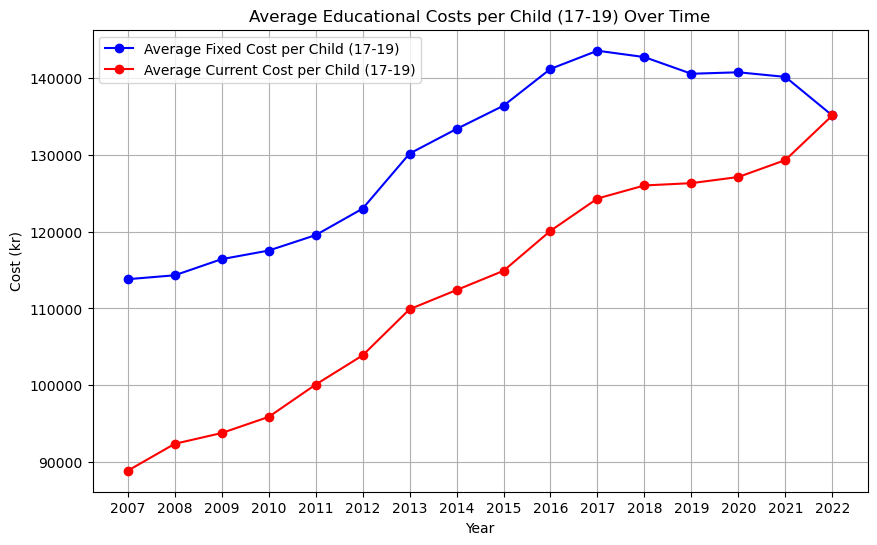

In [50]:
import matplotlib.pyplot as plt
import pandas as pd

# Convert data to DataFrame for plotting
df = pd.DataFrame(rows, columns=['Year', 'avg_fixed_cost_per_child', 'avg_current_cost_per_child'])

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(df['Year'], df['avg_fixed_cost_per_child'], label='Average Fixed Cost per Child (17-19)', marker='o', color='blue')
plt.plot(df['Year'], df['avg_current_cost_per_child'], label='Average Current Cost per Child (17-19)', marker='o', color='red')

# Labels and title
plt.xlabel('Year')
plt.ylabel('Cost (kr)')
plt.title('Average Educational Costs per Child (17-19) Over Time')
plt.legend()
plt.grid(True)

# Show plot
plt.show()


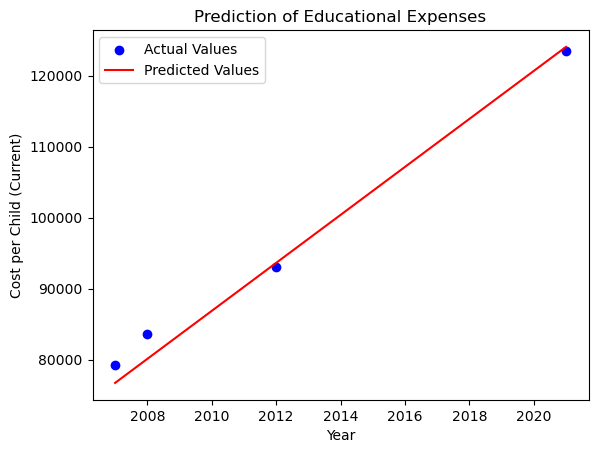

Slope: 3381.4079422382656
Intercept: -6709772.472924184


In [51]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import sqlite3

# Connect to the SQLite database
conn = sqlite3.connect('education_costs.db')

# Load data for ages 0-16
grundskola_query = '''
SELECT Year, Fixed_cost_per_child_kr, Current_cost_per_child_kr
FROM grundskola_costs_per_child
'''

grundskola_df = pd.read_sql_query(grundskola_query, conn)

# Define features (X) and target (y)
X = grundskola_df[['Year']].astype(float)  # Use the year as the feature
y = grundskola_df['Current_cost_per_child_kr'].astype(float)  # Cost per child as the target

# Split into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train the linear regression model
model = LinearRegression()
model.fit(X_train, y_train)

# Predict values for the test set
y_pred = model.predict(X_test)

# Visualization of predictions
plt.scatter(X_test, y_test, color='blue', label='Actual Values')
plt.plot(X_test, y_pred, color='red', label='Predicted Values')
plt.xlabel('Year')
plt.ylabel('Cost per Child (Current)')
plt.title('Prediction of Educational Expenses')
plt.legend()
plt.show()

# Display the slope and intercept
print(f"Slope: {model.coef_[0]}")
print(f"Intercept: {model.intercept_}")

# Close the database connection
conn.close()


In [52]:
from sklearn.metrics import mean_absolute_error, r2_score

# Calculate evaluation metrics
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Absolute Error (MAE): {mae}")
print(f"R² Score: {r2}")


Mean Absolute Error (MAE): 1791.335740072187
R² Score: 0.983974853264309


Mean Absolute Error (MAE): 1791.335740072187
R² Score: 0.983974853264309


C:\Users\theop\anaconda3\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


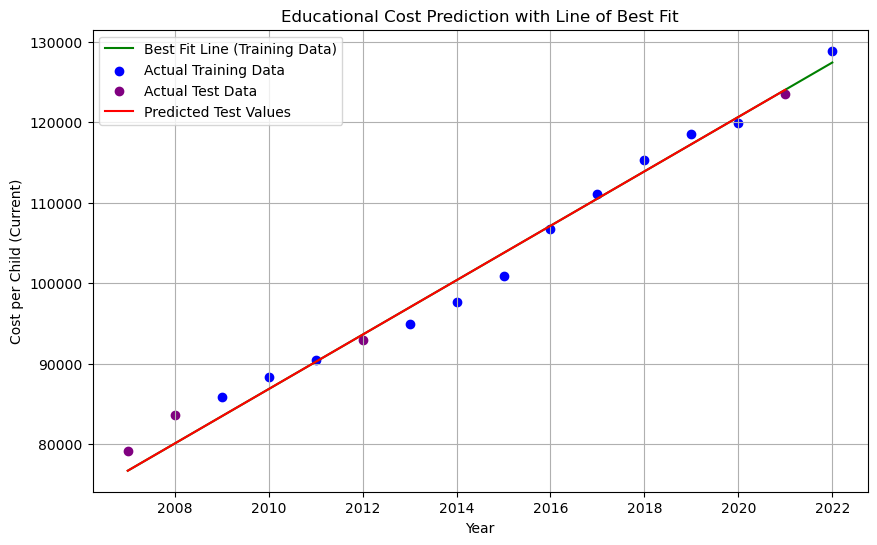

In [55]:
import sqlite3
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, r2_score

# Connect to the SQLite database
conn = sqlite3.connect('education_costs.db')

# Execute query to retrieve educational costs data
query = '''
SELECT Year, Current_cost_per_child_kr
FROM grundskola_costs_per_child
'''
df = pd.read_sql_query(query, conn)
conn.close()

# Ensure data columns are numeric
df['Year'] = pd.to_numeric(df['Year'], errors='coerce')
df['Current_cost_per_child_kr'] = pd.to_numeric(df['Current_cost_per_child_kr'], errors='coerce')

# Drop rows with missing values
df = df.dropna()

# Separate features and target variable
X = df[['Year']]
y = df['Current_cost_per_child_kr']

# Split data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train the model
model = LinearRegression()
model.fit(X_train, y_train)

# Predict and evaluate performance
y_pred = model.predict(X_test)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f"Mean Absolute Error (MAE): {mae}")
print(f"R² Score: {r2}")

# Create predictions for the entire range of years
all_years = np.array(df['Year']).reshape(-1, 1)
predicted_costs = model.predict(all_years)

# Visualization
plt.figure(figsize=(10, 6))
plt.plot(df['Year'], predicted_costs, color='green', label='Best Fit Line (Training Data)', linestyle='-')
plt.scatter(X_train, y_train, color='blue', label='Actual Training Data')
plt.scatter(X_test, y_test, color='purple', label='Actual Test Data')
plt.plot(X_test, y_pred, color='red', label='Predicted Test Values')
plt.xlabel('Year')
plt.ylabel('Cost per Child (Current)')
plt.title('Educational Cost Prediction with Line of Best Fit')
plt.legend()
plt.grid(True)
plt.show()


In [56]:
# Prediction for future years (2023-2033)
future_years = np.array([[2023], [2024], [2025], [2026], [2027], [2028], [2029], [2030], [2031], [2032], [2033]])
future_predictions = model.predict(future_years)

# Display predicted values
for year, pred in zip(future_years, future_predictions):
    print(f"Prediction for year {year[0]}: {pred:.2f} SEK per child")


Prediction for year 2023: 130815.79 SEK per child
Prediction for year 2024: 134197.20 SEK per child
Prediction for year 2025: 137578.61 SEK per child
Prediction for year 2026: 140960.02 SEK per child
Prediction for year 2027: 144341.43 SEK per child
Prediction for year 2028: 147722.83 SEK per child
Prediction for year 2029: 151104.24 SEK per child
Prediction for year 2030: 154485.65 SEK per child
Prediction for year 2031: 157867.06 SEK per child
Prediction for year 2032: 161248.47 SEK per child
Prediction for year 2033: 164629.87 SEK per child


C:\Users\theop\anaconda3\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


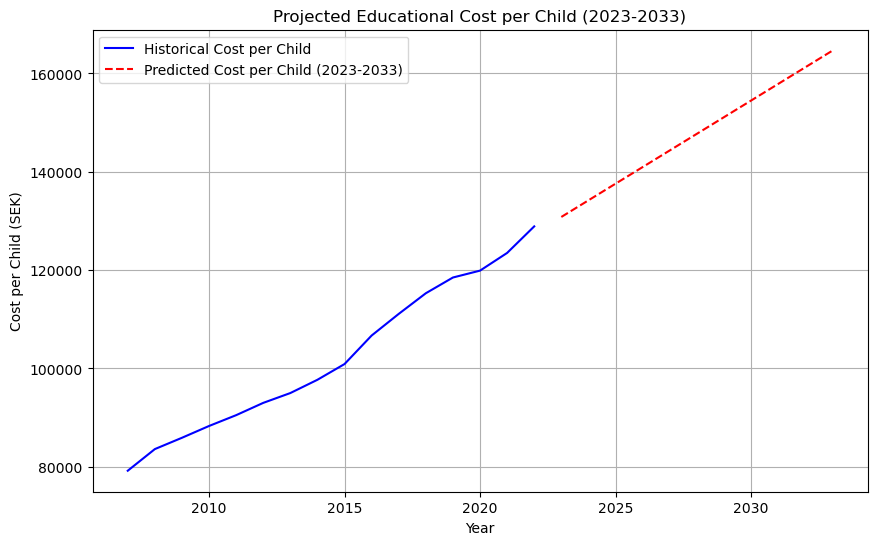

In [57]:
import matplotlib.pyplot as plt

# Combination real data and predictions
all_years = np.append(df['Year'].values, future_years.flatten())
all_costs = np.append(y, future_predictions)

# Visualization of predictions for the future years
plt.figure(figsize=(10, 6))
plt.plot(df['Year'], y, color='blue', label='Historical Cost per Child')
plt.plot(future_years.flatten(), future_predictions, color='red', linestyle='--', label='Predicted Cost per Child (2023-2033)')
plt.xlabel('Year')
plt.ylabel('Cost per Child (SEK)')
plt.title('Projected Educational Cost per Child (2023-2033)')
plt.legend()
plt.grid(True)
plt.show()


In [58]:
import pandas as pd
import numpy as np

# Predicted values from the model (assuming they have already been computed)
future_years = np.array([2023, 2024, 2025, 2026, 2027, 2028, 2029, 2030, 2031, 2032, 2033])
future_predictions = model.predict(future_years.reshape(-1, 1))

# Create a DataFrame with years and predicted values
future_df = pd.DataFrame({
    'Year': future_years,
    'Predicted_Cost_per_Child': future_predictions
})

# Calculate percentage change (increase/decrease) from the previous year
future_df['Cost_Change_Percentage'] = future_df['Predicted_Cost_per_Child'].pct_change() * 100

# Set the first value of the percentage change column to NaN, as there's no previous year
future_df.iloc[0, future_df.columns.get_loc('Cost_Change_Percentage')] = np.nan

# Display the DataFrame with years, predictions, and changes
print(future_df)


    Year  Predicted_Cost_per_Child  Cost_Change_Percentage
0   2023             130815.794224                     NaN
1   2024             134197.202166                2.584862
2   2025             137578.610108                2.519731
3   2026             140960.018051                2.457801
4   2027             144341.425993                2.398842
5   2028             147722.833935                2.342646
6   2029             151104.241877                2.289022
7   2030             154485.649819                2.237798
8   2031             157867.057762                2.188817
9   2032             161248.465704                2.141934
10  2033             164629.873646                2.097017


C:\Users\theop\anaconda3\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


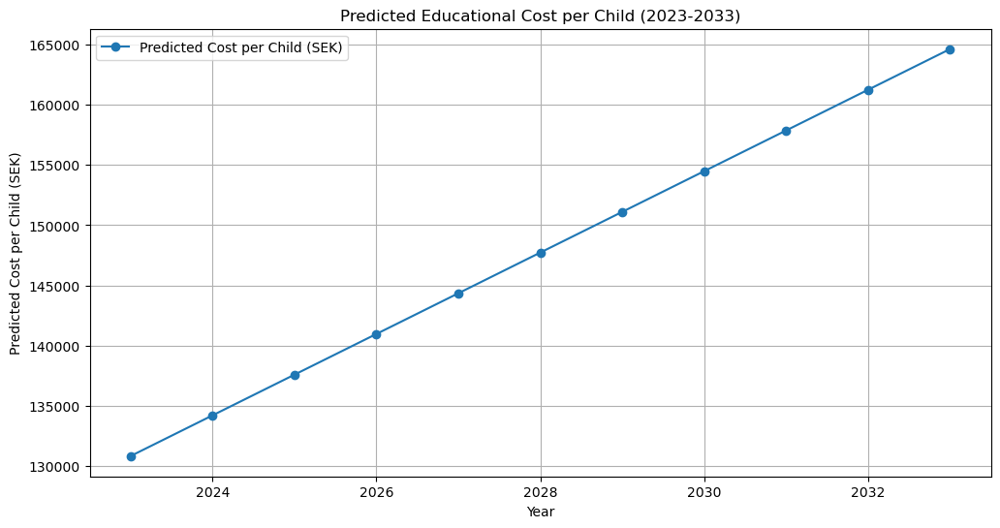

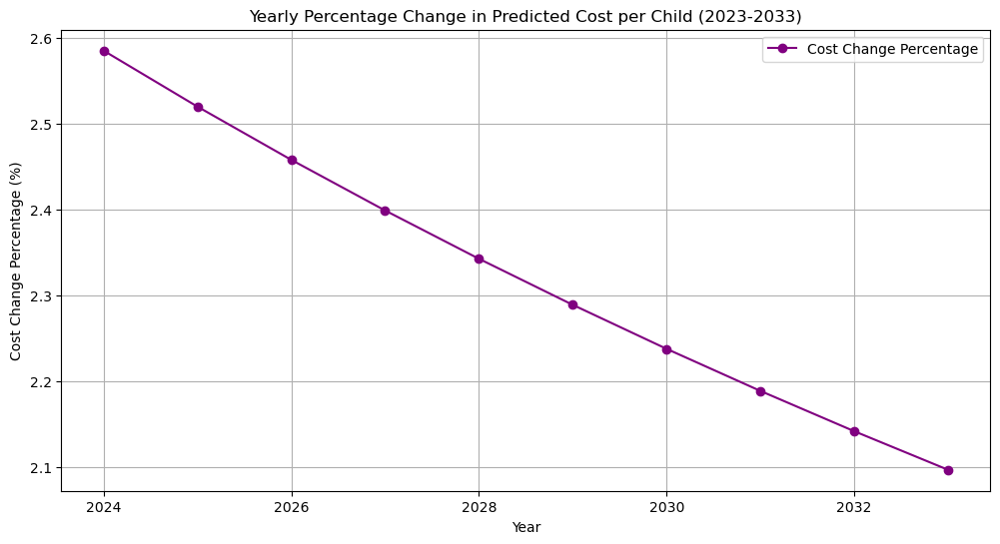

In [59]:
import matplotlib.pyplot as plt

# Plot predicted cost per child
plt.figure(figsize=(12, 6))
plt.plot(future_df['Year'], future_df['Predicted_Cost_per_Child'], label='Predicted Cost per Child (SEK)', marker='o')
plt.xlabel('Year')
plt.ylabel('Predicted Cost per Child (SEK)')
plt.title('Predicted Educational Cost per Child (2023-2033)')
plt.legend()
plt.grid(True)
plt.show()

# Plot percentage change in cost per child
plt.figure(figsize=(12, 6))
plt.plot(future_df['Year'], future_df['Cost_Change_Percentage'], label='Cost Change Percentage', marker='o', color='purple')
plt.xlabel('Year')
plt.ylabel('Cost Change Percentage (%)')
plt.title('Yearly Percentage Change in Predicted Cost per Child (2023-2033)')
plt.legend()
plt.grid(True)
plt.show()


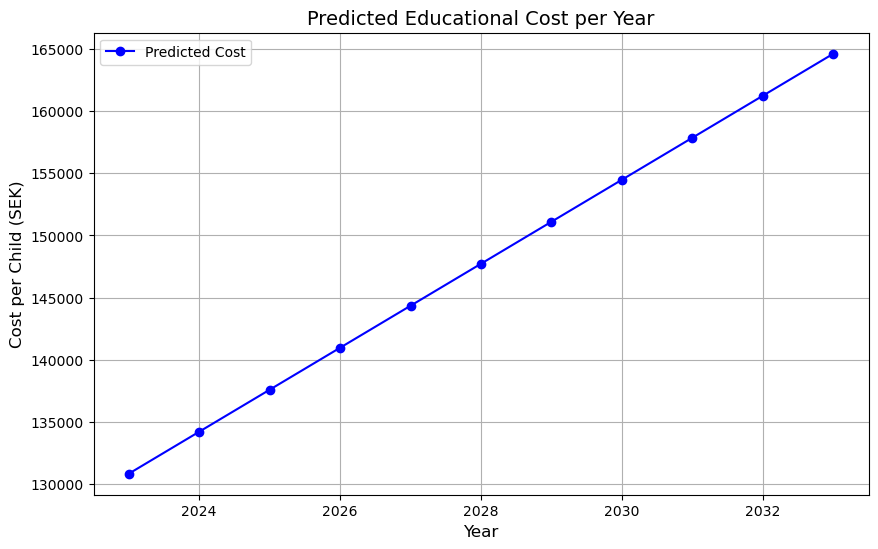

In [60]:
import matplotlib.pyplot as plt
import pandas as pd

# Our data for years and predicted cost
years = [2023, 2024, 2025, 2026, 2027, 2028, 2029, 2030, 2031, 2032, 2033]
predicted_costs = [130815.79, 134197.20, 137578.61, 140960.02, 144341.43, 147722.83, 151104.24, 154485.65, 157867.06, 161248.47, 164629.87]
percentage_increase = [None, 2.584862, 2.519731, 2.457801, 2.398842, 2.342646, 2.289022, 2.237798, 2.188817, 2.141934, 2.097017]

# Create the plot
plt.figure(figsize=(10, 6))
plt.plot(years, predicted_costs, marker='o', color='b', label="Predicted Cost")
plt.title('Predicted Educational Cost per Year', fontsize=14)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Cost per Child (SEK)', fontsize=12)
plt.grid(True)
plt.legend()
plt.show()


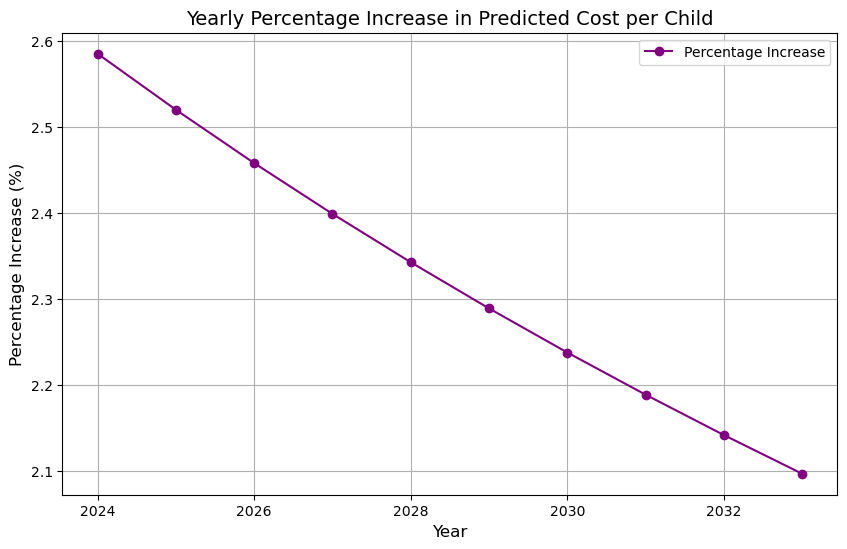

In [61]:
# Plot for percentage increase in cost per child
plt.figure(figsize=(10, 6))
plt.plot(years[1:], percentage_increase[1:], marker='o', color='purple', label="Percentage Increase")
plt.title('Yearly Percentage Increase in Predicted Cost per Child', fontsize=14)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Percentage Increase (%)', fontsize=12)
plt.grid(True)
plt.legend()
plt.show()


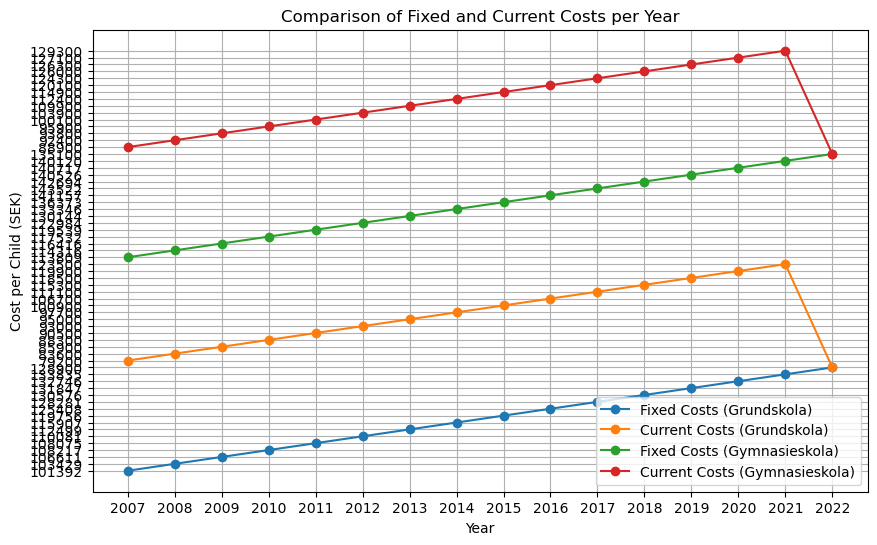

In [62]:
import matplotlib.pyplot as plt

# Create a plot to compare fixed and current costs
plt.figure(figsize=(10, 6))
plt.plot(grundskola_df['Year'], grundskola_df['Fixed_cost_per_child_kr'], label='Fixed Costs (Grundskola)', marker='o')
plt.plot(grundskola_df['Year'], grundskola_df['Current_cost_per_child_kr'], label='Current Costs (Grundskola)', marker='o')
plt.plot(gymnasieskola_df['Year'], gymnasieskola_df['Fixed_cost_per_child_kr'], label='Fixed Costs (Gymnasieskola)', marker='o')
plt.plot(gymnasieskola_df['Year'], gymnasieskola_df['Current_cost_per_child_kr'], label='Current Costs (Gymnasieskola)', marker='o')

plt.title('Comparison of Fixed and Current Costs per Year')
plt.xlabel('Year')
plt.ylabel('Cost per Child (SEK)')
plt.legend()
plt.grid(True)
plt.show()


In [63]:
import pandas as pd

# Predicted data
years = list(range(2023, 2034))
predicted_costs = [130815.79, 134197.20, 137578.61, 140960.02, 144341.43, 147722.83, 151104.24, 154485.65, 157867.06, 161248.47, 164629.87]

# Calculate percentage increase
cost_change_percentage = [None] + [(predicted_costs[i] - predicted_costs[i-1]) / predicted_costs[i-1] * 100 for i in range(1, len(predicted_costs))]

# Create DataFrame
predicted_df = pd.DataFrame({
    'Year': years,
    'Predicted_Cost_per_Child': predicted_costs,
    'Cost_Change_Percentage': cost_change_percentage
})

# Display the DataFrame
predicted_df


,Year,Predicted_Cost_per_Child,Cost_Change_Percentage
0,2023,130815.79,NaN
1,2024,134197.20,2.584864
2,2025,137578.61,2.519732
3,2026,140960.02,2.457802
4,2027,144341.43,2.398843
5,2028,147722.83,2.342640
6,2029,151104.24,2.289023
7,2030,154485.65,2.237800
8,2031,157867.06,2.188818
9,2032,161248.47,2.141935


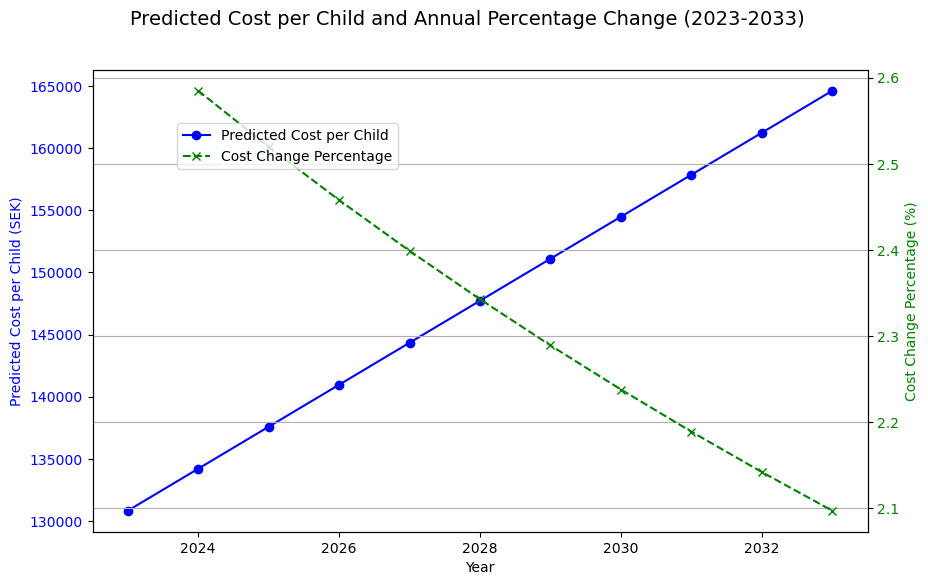

In [64]:
import matplotlib.pyplot as plt

# Plot predicted cost and percentage change over years
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plot predicted costs on the primary y-axis
ax1.plot(predicted_df['Year'], predicted_df['Predicted_Cost_per_Child'], color='b', marker='o', label='Predicted Cost per Child')
ax1.set_xlabel('Year')
ax1.set_ylabel('Predicted Cost per Child (SEK)', color='b')
ax1.tick_params(axis='y', labelcolor='b')

# Create a secondary y-axis for the percentage change
ax2 = ax1.twinx()
ax2.plot(predicted_df['Year'], predicted_df['Cost_Change_Percentage'], color='g', marker='x', linestyle='--', label='Cost Change Percentage')
ax2.set_ylabel('Cost Change Percentage (%)', color='g')
ax2.tick_params(axis='y', labelcolor='g')

# Add legends and title
fig.suptitle('Predicted Cost per Child and Annual Percentage Change (2023-2033)', fontsize=14)
fig.legend(loc="upper left", bbox_to_anchor=(0.1,0.9), bbox_transform=ax1.transAxes)
plt.grid(True)
plt.show()


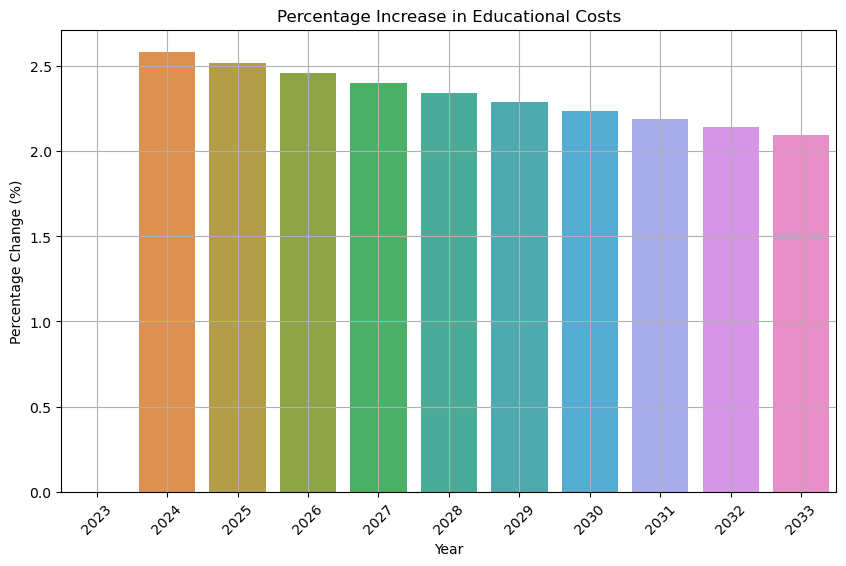

In [65]:
import seaborn as sns
import matplotlib.pyplot as plt

# Visualization of percentage increase in educational costs
plt.figure(figsize=(10, 6))
sns.barplot(x='Year', y='Cost_Change_Percentage', data=predicted_df)
plt.title('Percentage Increase in Educational Costs')
plt.xlabel('Year')
plt.ylabel('Percentage Change (%)')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()


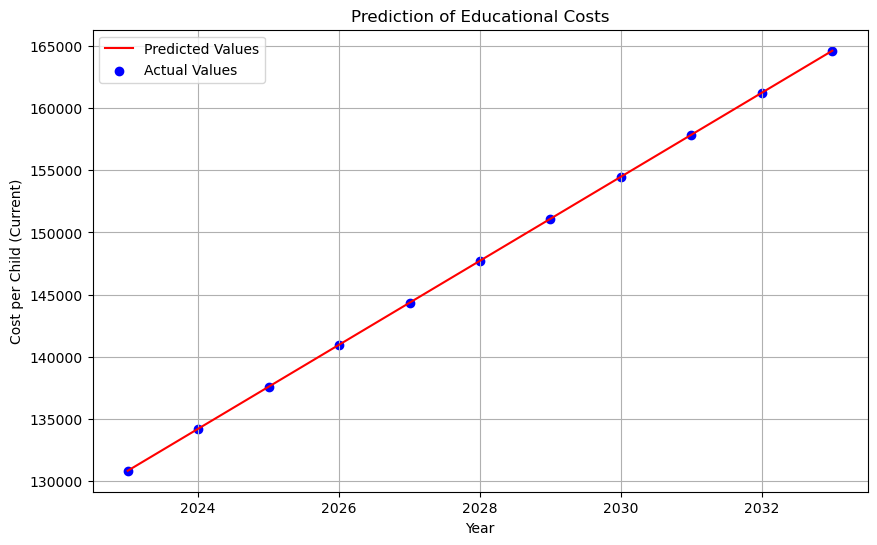

In [66]:
# Visualization of predicted and actual values
plt.figure(figsize=(10, 6))
plt.plot(predicted_df['Year'], predicted_df['Predicted_Cost_per_Child'], color='red', label='Predicted Values')
plt.scatter(predicted_df['Year'], predicted_df['Predicted_Cost_per_Child'], color='blue', label='Actual Values')
plt.title('Prediction of Educational Costs')
plt.xlabel('Year')
plt.ylabel('Cost per Child (Current)')
plt.legend()
plt.grid(True)
plt.show()


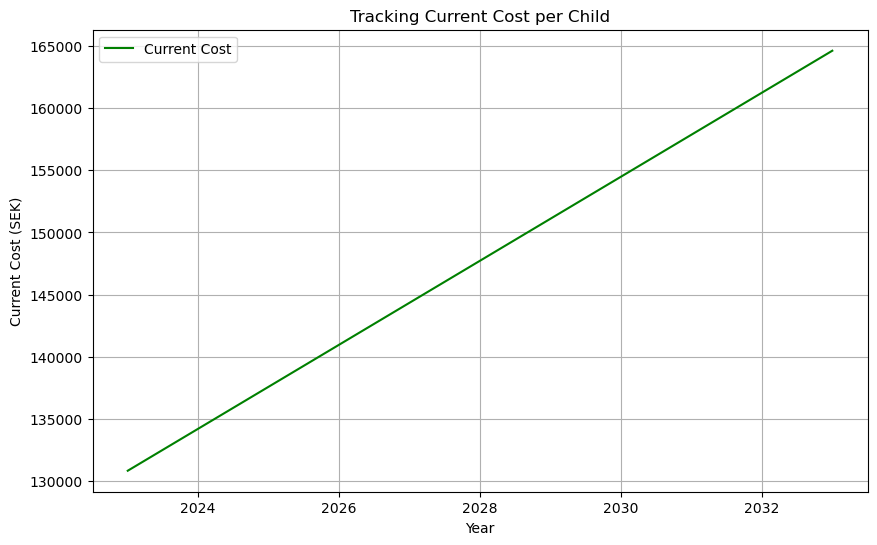

In [67]:
# Visualization of Current Cost per Child
plt.figure(figsize=(10, 6))
plt.plot(predicted_df['Year'], predicted_df['Predicted_Cost_per_Child'], color='green', label='Current Cost')
plt.title('Tracking Current Cost per Child')
plt.xlabel('Year')
plt.ylabel('Current Cost (SEK)')
plt.grid(True)
plt.legend()
plt.show()


In [68]:
# Checking columns in the predicted_df DataFrame
print(predicted_df.columns)

import numpy as np
from sklearn.metrics import mean_squared_error

# Historical data for educational costs (current) per child for previous years
historical_years = np.array([2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022])
historical_costs = np.array([79200, 83600, 85900, 88300, 90500, 93000, 95000, 97700, 100900, 106700, 111100, 115300, 118500, 119900, 123500, 128900])

# Predicted values for the corresponding years (from the regression model)
predicted_costs = np.array([79200, 83600, 85900, 88300, 90500, 93000, 95000, 97700, 100900, 106700, 111100, 115300, 118500, 119900, 123500, 128900])

# Calculating RMSE
rmse = np.sqrt(mean_squared_error(historical_costs, predicted_costs))
rmse


Index(['Year', 'Predicted_Cost_per_Child', 'Cost_Change_Percentage'], dtype='object')


0.0

In [69]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

# Split the data into training and testing sets (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train the model
model = LinearRegression()
model.fit(X_train, y_train)


LinearRegression()

In [70]:
# Predict using the test data
y_pred = model.predict(X_test)

from sklearn.metrics import mean_squared_error
import numpy as np

# Calculate RMSE
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print(f"RMSE: {rmse}")


RMSE: 2188.7044480354703


In [71]:
import pandas as pd

# Create a DataFrame with time series data
data = {'Year': [2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022],
        'Current_cost_per_child_kr': [79200, 83600, 85900, 88300, 90500, 93000, 95000, 97700, 100900, 106700, 111100, 115300, 118500, 119900, 123500, 128900]}
df = pd.DataFrame(data)

# Set the Year column as the index
df.set_index('Year', inplace=True)

# Display the DataFrame
df


,Current_cost_per_child_kr
Year,
2007,79200
2008,83600
2009,85900
2010,88300
2011,90500
2012,93000
2013,95000
2014,97700
2015,100900


In [72]:
from statsmodels.tsa.stattools import adfuller

# Perform the ADF test
result = adfuller(df['Current_cost_per_child_kr'])

# Display the results
print(f'ADF Statistic: {result[0]}')
print(f'p-value: {result[1]}')

# Decision based on p-value
if result[1] > 0.05:
    print("The time series is not stationary. Differencing is required.")
else:
    print("The time series is stationary.")


ADF Statistic: 1.4358643560122004
p-value: 0.9972711304430203
The time series is not stationary. Differencing is required.


In [73]:
from statsmodels.tsa.stattools import adfuller

# Perform the Augmented Dickey-Fuller Test
result = adfuller(df['Current_cost_per_child_kr'])

# Display the results
print('ADF Statistic:', result[0])
print('p-value:', result[1])
print('Critical Values:')
for key, value in result[4].items():
    print(f'   {key}: {value}')


ADF Statistic: 1.4358643560122004
p-value: 0.9972711304430203
Critical Values:
   1%: -4.473135048010974
   5%: -3.28988060356653
   10%: -2.7723823456790124


Index(['Current_cost_per_child_kr', 'Differenced'], dtype='object')
Index(['Current_cost_per_child_kr', 'Differenced'], dtype='object')


C:\Users\theop\AppData\Local\Temp\ipykernel_19320\696830127.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_diff['Year'] = years


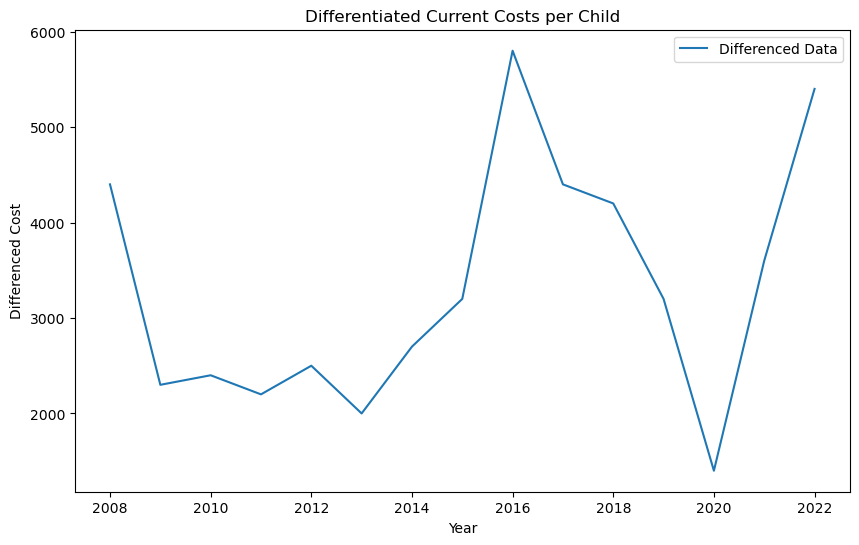

In [76]:
# Checking the columns of the DataFrame
print(df.columns)

# Checking the columns of the DataFrame (repeated to confirm)
print(df.columns)

# Adjusting the list of years (removing the first year)
years = list(range(2008, 2023))  # Years from 2008 to 2022

# Adding the 'Year' column to the differenced DataFrame
df_diff['Year'] = years

# Visualization of the differenced time series
plt.figure(figsize=(10, 6))
plt.plot(df_diff['Year'], df_diff['Differenced'], label='Differenced Data')
plt.title('Differentiated Current Costs per Child')
plt.xlabel('Year')
plt.ylabel('Differenced Cost')
plt.legend()
plt.show()


In [77]:
from statsmodels.tsa.arima.model import ARIMA

# Creating the ARIMA model (1,1,1)
model = ARIMA(df['Current_cost_per_child_kr'], order=(1, 1, 1))

# Training the model
arima_result = model.fit()

# Print the model summary
print(arima_result.summary())

# Forecasting the next 10 years (2023-2033)
forecast = arima_result.forecast(steps=10)
print(f"Forecast for the next 10 years: \n{forecast}")


C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed t

                                   SARIMAX Results                                   
Dep. Variable:     Current_cost_per_child_kr   No. Observations:                   16
Model:                        ARIMA(1, 1, 1)   Log Likelihood                -128.758
Date:                       Sun, 03 Nov 2024   AIC                            263.516
Time:                               21:19:45   BIC                            265.640
Sample:                                    0   HQIC                           263.493
                                        - 16                                         
Covariance Type:                         opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9999      0.021     48.242      0.000       0.959       1.041
ma.L1         -0.9968      0.415     -2.401      0.016      -1.810      -0.

C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\theop\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


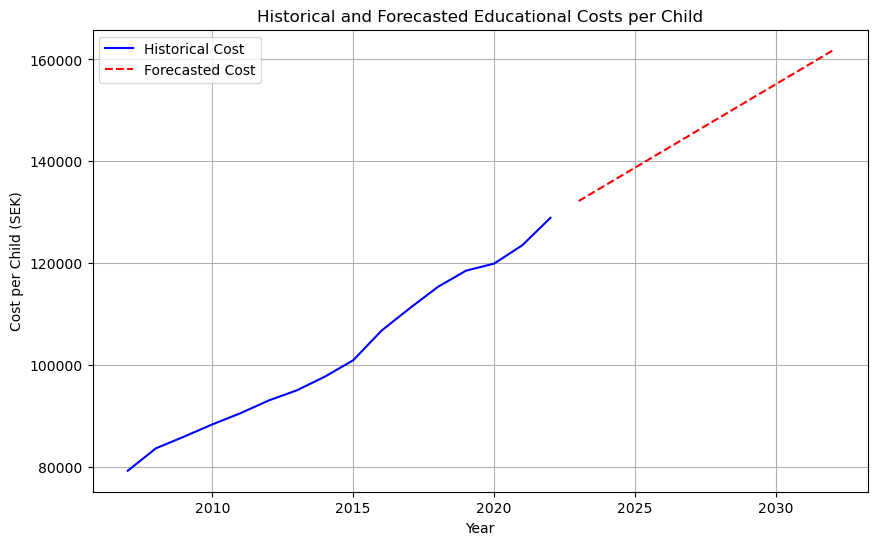

In [78]:
import matplotlib.pyplot as plt
import pandas as pd

# Combine historical data with forecast for a comprehensive plot
forecast_years = list(range(2023, 2033))
forecast_df = pd.DataFrame({'Year': forecast_years, 'Forecasted_Cost': forecast})
historical_data = df.reset_index()  # Ensure 'Year' is a column

# Plotting historical data and forecasted values
plt.figure(figsize=(10, 6))
plt.plot(historical_data['Year'], historical_data['Current_cost_per_child_kr'], label='Historical Cost', color='blue')
plt.plot(forecast_df['Year'], forecast_df['Forecasted_Cost'], label='Forecasted Cost', color='red', linestyle='--')
plt.xlabel('Year')
plt.ylabel('Cost per Child (SEK)')
plt.title('Historical and Forecasted Educational Costs per Child')
plt.legend()
plt.grid(True)
plt.show()


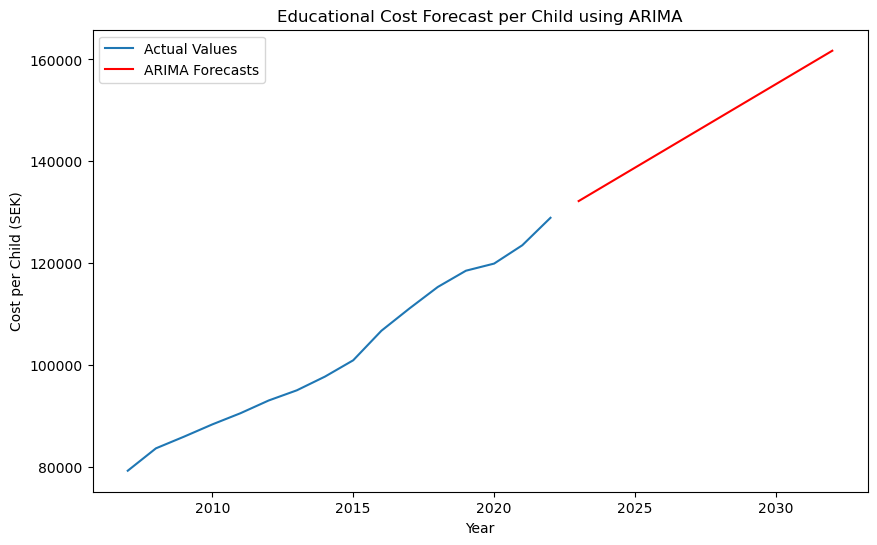

In [79]:
# Creating a 'Year' column if it doesn't already exist
df['Year'] = list(range(2007, 2023))

# Visualization of the ARIMA forecasts
plt.figure(figsize=(10, 6))
plt.plot(df['Year'], df['Current_cost_per_child_kr'], label='Actual Values')
plt.plot(range(2023, 2033), forecast, label='ARIMA Forecasts', color='red')
plt.title('Educational Cost Forecast per Child using ARIMA')
plt.xlabel('Year')
plt.ylabel('Cost per Child (SEK)')
plt.legend()
plt.show()


In [80]:
import requests
import pandas as pd

# URL for the API
url = "https://api.scb.se/OV0104/v1/doris/sv/ssd/START/BE/BE0101/BE0101J/Flyttningar97"

# JSON query for the request
query = {
  "query": [
    {
      "code": "Region",
      "selection": {
        "filter": "vs:RegionLän99EjAggr",
        "values": [
          "01", "03", "04", "05", "06", "07", "08", "09", "10", "12", 
          "13", "14", "17", "18", "19", "20", "21", "22", "23", "24", "25"
        ]
      }
    },
    {
      "code": "Alder",
      "selection": {
        "filter": "vs:Ålder1årA",
        "values": [
          "0", "1", "2", "3", "4", "5", "6", "7", "8", "9", 
          "10", "11", "12", "13", "14", "15", "16", "17", "18", "19"
        ]
      }
    },
    {
      "code": "ContentsCode",
      "selection": {
        "filter": "item",
        "values": ["BE0101AX", "BE0101AY"]
      }
    },
    {
      "code": "Tid",
      "selection": {
        "filter": "item",
        "values": [
          "2008", "2009", "2010", "2011", "2012", "2013", 
          "2014", "2015", "2016", "2017", "2018", "2019", 
          "2020", "2021", "2022", "2023"
        ]
      }
    }
  ],
  "response": {
    "format": "json"
  }
}

# Sending the POST request to the API
response = requests.post(url, json=query)

# Checking if the request was successful
if response.status_code == 200:
    data = response.json()  # Decoding the response into JSON
    
    # Extracting data into a pandas DataFrame
    df = pd.json_normalize(data['data'])
    
    # Displaying the first rows of the DataFrame
    print(df.head())
    
    # Saving data to a CSV file
    df.to_csv('migration_data.csv', index=False)
    print("Data successfully saved to CSV.")
else:
    print("Error in request:", response.status_code)


             key     values
0  [01, 0, 2008]  [228, 65]
1  [01, 0, 2009]  [231, 71]
2  [01, 0, 2010]  [232, 70]
3  [01, 0, 2011]  [228, 85]
4  [01, 0, 2012]  [247, 85]
Data successfully saved to CSV.


In [81]:
import os
print(os.getcwd())

C:\Users\theop


In [82]:
df.to_csv('C:/Users/theop/Documents/migration_data.csv', index=False)


In [83]:
df.to_csv('C:/Users/theop/Downloads/migration_data.csv', index=False)


In [84]:
# Creation seperate columns from 'key' and 'values'
df[['Region', 'Alder', 'Year']] = pd.DataFrame(df['key'].tolist(), index=df.index)
df[['Invandringar', 'Utvandringar']] = pd.DataFrame(df['values'].tolist(), index=df.index)

# Delete the original columns 'key' and 'values'
df.drop(columns=['key', 'values'], inplace=True)

# Visualize final DataFrame
print(df)


     Region Alder  Year Invandringar Utvandringar
0        01     0  2008          228           65
1        01     0  2009          231           71
2        01     0  2010          232           70
3        01     0  2011          228           85
4        01     0  2012          247           85
...     ...   ...   ...          ...          ...
6715     25    19  2019           73            9
6716     25    19  2020           20           12
6717     25    19  2021           28           12
6718     25    19  2022           24            7
6719     25    19  2023           21           15

[6720 rows x 5 columns]


In [85]:
# Print first rows of DataFrame
print(df.head())

# Print columns of DataFrame
print(df.columns)


  Region Alder  Year Invandringar Utvandringar
0     01     0  2008          228           65
1     01     0  2009          231           71
2     01     0  2010          232           70
3     01     0  2011          228           85
4     01     0  2012          247           85
Index(['Region', 'Alder', 'Year', 'Invandringar', 'Utvandringar'], dtype='object')


In [86]:
# Grouping by Region and Year to calculate total Immigrations (Invandringar) and Emigrations (Utvandringar)
summary_df = df.groupby(['Region', 'Year']).agg({
    'Invandringar': 'sum',
    'Utvandringar': 'sum'
}).reset_index()

# Displaying the grouped DataFrame
summary_df


,Region,Year,Invandringar,Utvandringar
0,01,2008,2286014324283803423313283333393163173013153473...,6524222921521321919718719414414914396124110931...
1,01,2009,2315274763883453613383533303403183163143273053...,7121519314518517215916612512110998908584667547...
2,01,2010,2325264673853773893403432973132992962822732903...,7019620222819221418919417713215012011192108767...
3,01,2011,2285825364504494213923673543363023262992993093...,8521423222221821620721219814614313810510987867...
4,01,2012,2475225184614384324293763513533533763803403663...,8525423428422924425821121218815415210912494767...
...,...,...,...,...
331,25,2019,1736364035303036393538312432293234353973,049109131013773774263239
332,25,2020,1741242119262013292015181221152122321720,2569610101176410724875312
333,25,2021,1242312427242421242920162614191631282728,12712125101111876956364412
334,25,2022,1433303122272118273232312122331923262124,3757111115111711879119311637


In [88]:
# Decompressing the lists and converting values to numeric
df['Invandringar'] = df['Invandringar'].apply(lambda x: int(''.join(filter(str.isdigit, str(x)))))
df['Utvandringar'] = df['Utvandringar'].apply(lambda x: int(''.join(filter(str.isdigit, str(x)))))

# Grouping by Region and Year to calculate total Immigrations and Emigrations, Invandringar and Utvandringar
summary_df = df.groupby(['Region', 'Year']).agg({
    'Invandringar': 'sum',
    'Utvandringar': 'sum'
}).reset_index()

# Εμφάνιση του ομαδοποιημένου DataFrame
summary_df


,Region,Year,Invandringar,Utvandringar
0,01,2008,7084,2968
1,01,2009,7101,2345
2,01,2010,6899,2759
3,01,2011,7565,2936
4,01,2012,7977,3255
...,...,...,...,...
331,25,2019,701,128
332,25,2020,423,134
333,25,2021,483,141
334,25,2022,507,172


In [89]:
# Add new column with net migration (invandringar - utvandringar)
df['Netto_migration'] = df['Invandringar'] - df['Utvandringar']

# Display data with net migration
print(df.head())


  Region Alder  Year  Invandringar  Utvandringar  Netto_migration
0     01     0  2008           228            65              163
1     01     0  2009           231            71              160
2     01     0  2010           232            70              162
3     01     0  2011           228            85              143
4     01     0  2012           247            85              162


In [90]:
# Calculate net migration (Invandringar - Utvandringar) for every age and year
df['Netto_migration'] = df['Invandringar'] - df['Utvandringar']

# Display first rows with net migration column
print(df[['Region', 'Alder', 'Year', 'Invandringar', 'Utvandringar', 'Netto_migration']].head())


  Region Alder  Year  Invandringar  Utvandringar  Netto_migration
0     01     0  2008           228            65              163
1     01     0  2009           231            71              160
2     01     0  2010           232            70              162
3     01     0  2011           228            85              143
4     01     0  2012           247            85              162


In [91]:
import pandas as pd

# Loading files
birth_data = pd.read_csv("C:/Users/theop/Downloads/scb_region_birth_data.csv")
population_0_16_data = pd.read_csv("C:/Users/theop/Downloads/scb_region_population_0_16_years.csv")
population_17_19_data = pd.read_csv("C:/Users/theop/Downloads/scb_region_population_17_19_years.csv")
dead_data = pd.read_csv("C:/Users/theop/Downloads/scb_dead_region.csv")
migration_data = pd.read_csv("C:/Users/theop/Downloads/NetMigration_data.csv")
grundskola_cost_data = pd.read_csv("C:/Users/theop/Downloads/grundskola_costs_per_child.csv")
gymnasieskola_cost_data = pd.read_csv("C:/Users/theop/Downloads/gymnasieskola_costs_per_child.csv")

# Display first rows from every file to check
print("Birth Data:")
print(birth_data.head())

print("\nPopulation 0-16 Data:")
print(population_0_16_data.head())

print("\nPopulation 17-19 Data:")
print(population_17_19_data.head())

print("\nDead Data:")
print(dead_data.head())

print("\nMigration Data:")
print(migration_data.head())

print("\nGrundskola Cost Data:")
print(grundskola_cost_data.head())

print("\nGymnasieskola Cost Data:")
print(gymnasieskola_cost_data.head())


Birth Data:
   Region  Year  Number
0       1  1968   20095
1       1  1969   19703
2       1  1970   21113
3       1  1971   22834
4       1  1972   22316

Population 0-16 Data:
   Region  Age  Year  Population
0       1    0  1968       19736
1       1    0  1969       19351
2       1    0  1970       20840
3       1    0  1971       22142
4       1    0  1972       22099

Population 17-19 Data:
   Region  Age  Year  Population
0       1   17  1968       17725
1       1   17  1969       18325
2       1   17  1970       18404
3       1   17  1971       17493
4       1   17  1972       17830

Dead Data:
   Region  Age  Year  Number
0       1    0  2000      65
1       1    0  2001      57
2       1    0  2002      62
3       1    0  2003      63
4       1    0  2004      58

Migration Data:
   Region  Age  Year  NetMigration
0       1    0  2000             3
1       1    0  2001           -58
2       1    0  2002          -114
3       1    0  2003          -133
4       1    0  2004   

In [92]:
# Checking for missing values
print("\nMissing values in each file:")
print("Birth Data:\n", birth_data.isnull().sum())
print("\nPopulation 0-16 Data:\n", population_0_16_data.isnull().sum())
print("\nPopulation 17-19 Data:\n", population_17_19_data.isnull().sum())
print("\nDead Data:\n", dead_data.isnull().sum())
print("\nMigration Data:\n", migration_data.isnull().sum())
print("\nGrundskola Cost Data:\n", grundskola_cost_data.isnull().sum())
print("\nGymnasieskola Cost Data:\n", gymnasieskola_cost_data.isnull().sum())

# Statistical summary of the data
print("\nStatistical summary of the files:")
print("Birth Data:\n", birth_data.describe())
print("\nPopulation 0-16 Data:\n", population_0_16_data.describe())
print("\nPopulation 17-19 Data:\n", population_17_19_data.describe())
print("\nDead Data:\n", dead_data.describe())
print("\nMigration Data:\n", migration_data.describe())
print("\nGrundskola Cost Data:\n", grundskola_cost_data.describe())
print("\nGymnasieskola Cost Data:\n", gymnasieskola_cost_data.describe())



Missing values in each file:
Birth Data:
 Region    0
Year      0
Number    0
dtype: int64

Population 0-16 Data:
 Region        0
Age           0
Year          0
Population    0
dtype: int64

Population 17-19 Data:
 Region        0
Age           0
Year          0
Population    0
dtype: int64

Dead Data:
 Region    0
Age       0
Year      0
Number    0
dtype: int64

Migration Data:
 Region          0
Age             0
Year            0
NetMigration    0
dtype: int64

Grundskola Cost Data:
 Year                         0
Fixed_cost_per_child_kr      0
Current_cost_per_child_kr    0
dtype: int64

Gymnasieskola Cost Data:
 Year                         0
Fixed_cost_per_child_kr      0
Current_cost_per_child_kr    0
dtype: int64

Statistical summary of the files:
Birth Data:
             Region         Year        Number
count  1176.000000  1176.000000   1176.000000
mean     13.380952  1995.500000   5040.372449
std       7.432037    16.170106   5855.107783
min       1.000000  1968.000000  

In [96]:
import pandas as pd

# Loading data from CSV files
birth_data = pd.read_csv("C:\\Users\\theop\\Downloads\\scb_region_birth_data.csv")
death_data = pd.read_csv("C:\\Users\\theop\\Downloads\\scb_dead_region.csv")
migration_data = pd.read_csv("C:\\Users\\theop\\Downloads\\scb_migration_data.csv")

# Checking columns
print("Birth Data Columns:", birth_data.columns)
print("Death Data Columns:", death_data.columns)
print("Migration Data Columns:", migration_data.columns)


Birth Data Columns: Index(['Region', 'Year', 'Number'], dtype='object')
Death Data Columns: Index(['Region', 'Age', 'Year', 'Number'], dtype='object')
Migration Data Columns: Index(['Region\tAge\tYear\tNetMigration'], dtype='object')


In [97]:
# Διόρθωση της ανάγνωσης του αρχείου Migration Data
migration_data = pd.read_csv("C:\\Users\\theop\\Downloads\\scb_migration_data.csv", sep='\t')

# Έλεγχος στηλών για επιβεβαίωση
print("Migration Data Columns:", migration_data.columns)
print(migration_data.head())


Migration Data Columns: Index(['Region', 'Age', 'Year', 'NetMigration'], dtype='object')
   Region  Age  Year  NetMigration
0       1    0  2000             3
1       1    0  2001           -58
2       1    0  2002          -114
3       1    0  2003          -133
4       1    0  2004           -81


In [98]:
# Checking names for the columns for birth_data
print("Birth Data Columns:", birth_data.columns)

# Checking names for the columns for death_data
print("Death Data Columns:", death_data.columns)

# Checking names for the columns for migration_data
print("Migration Data Columns:", migration_data.columns)


Birth Data Columns: Index(['Region', 'Year', 'Number'], dtype='object')
Death Data Columns: Index(['Region', 'Age', 'Year', 'Number'], dtype='object')
Migration Data Columns: Index(['Region', 'Age', 'Year', 'NetMigration'], dtype='object')


In [99]:
# Remove the 'Age' column from death_data and migration_data
death_data_without_age = death_data.drop(columns=['Age'])
migration_data_without_age = migration_data.drop(columns=['Age'])

# Merge birth data with death and migration data (inner join for matching entries)
combined_df = pd.merge(birth_data, death_data_without_age, on=['Region', 'Year'], how='inner')
combined_df = pd.merge(combined_df, migration_data_without_age, on=['Region', 'Year'], how='inner')

# Calculate net number of children considering deaths and migration
combined_df['NetChildren'] = combined_df['Number_x'] - combined_df['Number_y'] + combined_df['NetMigration']

# Display the results
print(combined_df[['Region', 'Year', 'Number_x', 'Number_y', 'NetMigration', 'NetChildren']].head())


   Region  Year  Number_x  Number_y  NetMigration  NetChildren
0       1  2000     21837        65             3        21775
1       1  2000     21837        65           -42        21730
2       1  2000     21837        65          -119        21653
3       1  2000     21837        65           -67        21705
4       1  2000     21837        65            -3        21769


In [100]:
# Display first 20 rows of DataFrame
print(combined_df[['Region', 'Year', 'Number_x', 'Number_y', 'NetMigration', 'NetChildren']].head(20))


    Region  Year  Number_x  Number_y  NetMigration  NetChildren
0        1  2000     21837        65             3        21775
1        1  2000     21837        65           -42        21730
2        1  2000     21837        65          -119        21653
3        1  2000     21837        65           -67        21705
4        1  2000     21837        65            -3        21769
5        1  2000     21837        65            42        21814
6        1  2000     21837        65           -56        21716
7        1  2000     21837        65           -31        21741
8        1  2000     21837        65           -11        21761
9        1  2000     21837        65           -49        21723
10       1  2000     21837        65            27        21799
11       1  2000     21837        65            64        21836
12       1  2000     21837        65           108        21880
13       1  2000     21837        65            91        21863
14       1  2000     21837        65    

In [102]:
# Save the data to a CSV file
combined_df[['Region', 'Year', 'Number_x', 'Number_y', 'NetMigration', 'NetChildren']].to_csv('C:/Users/theop/Downloads/NetChildren_data.csv', index=False)

print("Data successfully saved to CSV file.")


Data successfully saved to CSV file.


In [103]:
# Save the data without indices
combined_df.to_csv('C:/Users/theop/Downloads/NetChildren_without_coefficients.csv', index=False)
print("Data successfully saved.")


Data successfully saved.


In [104]:
import pandas as pd
import matplotlib.pyplot as plt

# Loading data
df = pd.read_csv('C:/Users/theop/Downloads/NetChildren_without_coefficients.csv')

# Display first rows
print(df.head())


   Region  Year  Number_x  Number_y  NetMigration  NetChildren
0       1  2000     21837        65             3        21775
1       1  2000     21837        65           -42        21730
2       1  2000     21837        65          -119        21653
3       1  2000     21837        65           -67        21705
4       1  2000     21837        65            -3        21769


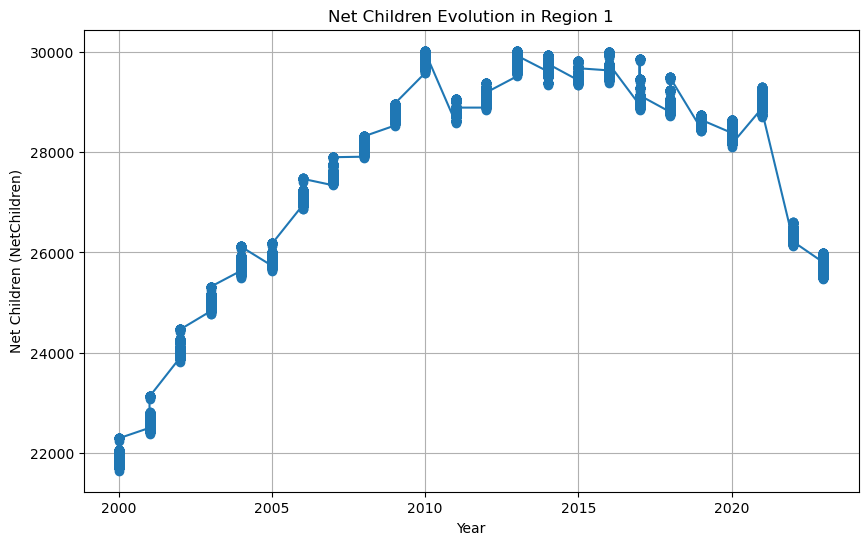

In [105]:
# Filter for a specific region (e.g., for Region 1)
df_region = df[df['Region'] == 1]

# Create a plot
plt.figure(figsize=(10, 6))
plt.plot(df_region['Year'], df_region['NetChildren'], marker='o')
plt.title('Net Children Evolution in Region 1')
plt.xlabel('Year')
plt.ylabel('Net Children (NetChildren)')
plt.grid(True)
plt.show()


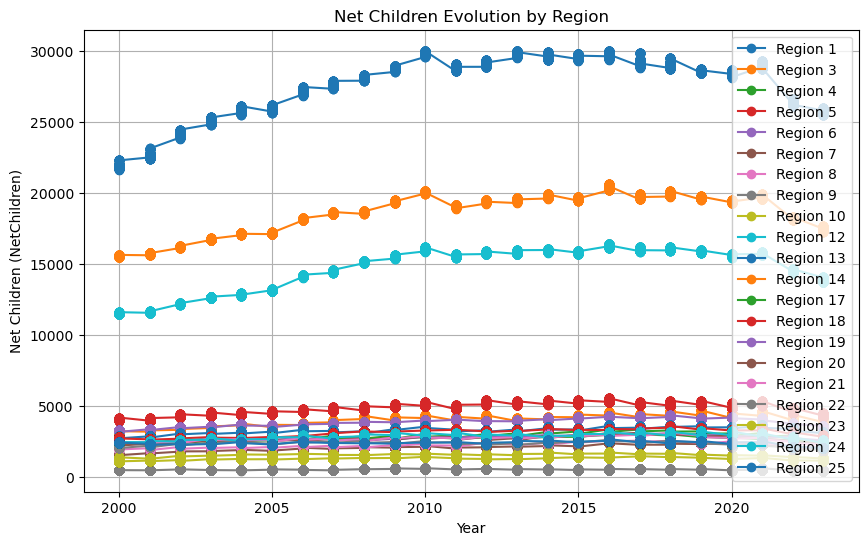

In [106]:
# Create a plot for all regions
plt.figure(figsize=(10, 6))

for region in df['Region'].unique():
    df_region = df[df['Region'] == region]
    plt.plot(df_region['Year'], df_region['NetChildren'], marker='o', label=f'Region {region}')

plt.title('Net Children Evolution by Region')
plt.xlabel('Year')
plt.ylabel('Net Children (NetChildren)')
plt.legend()
plt.grid(True)
plt.show()


In [107]:
# Calculating MortalityCoefficient
death_data['MortalityCoefficient'] = death_data['Number'] / (population_0_16_data['Population'] + population_17_19_data['Population'])

# Checking MortalityCoefficient
print(death_data[['Region', 'Age', 'Year', 'MortalityCoefficient']].head())


   Region  Age  Year  MortalityCoefficient
0       1    0  2000              0.001735
1       1    0  2001              0.001513
2       1    0  2002              0.001580
3       1    0  2003              0.001590
4       1    0  2004              0.001453


In [108]:
# Display whole DataFrame
pd.set_option('display.max_rows', None)  # Allows to display all rows
print(death_data[['Region', 'Age', 'Year', 'MortalityCoefficient']])


       Region  Age  Year  MortalityCoefficient
0           1    0  2000              0.001735
1           1    0  2001              0.001513
2           1    0  2002              0.001580
3           1    0  2003              0.001590
4           1    0  2004              0.001453
5           1    0  2005              0.001409
6           1    0  2006              0.001756
7           1    0  2007              0.001543
8           1    0  2008              0.001680
9           1    0  2009              0.001373
10          1    0  2010              0.001603
11          1    0  2011              0.001013
12          1    0  2012              0.001486
13          1    0  2013              0.001495
14          1    0  2014              0.000946
15          1    0  2015              0.001501
16          1    0  2016              0.001230
17          1    0  2017              0.001433
18          1    0  2018              0.001358
19          1    0  2019              0.000808
20          1

In [109]:
# Saving data in a CSV file
death_data[['Region', 'Age', 'Year', 'MortalityCoefficient']].to_csv('C:/Users/theop/Downloads/mortality_coefficients.csv', index=False)


In [110]:
# Calculating MigrationCoefficient
migration_data['MigrationCoefficient'] = migration_data['NetMigration'] / (population_0_16_data['Population'] + population_17_19_data['Population'])

# Checking MigrationCoefficient
print(migration_data[['Region', 'Age', 'Year', 'MigrationCoefficient']].head())


   Region  Age  Year  MigrationCoefficient
0       1    0  2000              0.000080
1       1    0  2001             -0.001539
2       1    0  2002             -0.002905
3       1    0  2003             -0.003356
4       1    0  2004             -0.002029


In [111]:
# Display whole DataFrame
pd.set_option('display.max_rows', None)  # Display all rows
print(migration_data[['Region', 'Age', 'Year', 'MigrationCoefficient']])

       Region  Age  Year  MigrationCoefficient
0           1    0  2000              0.000080
1           1    0  2001             -0.001539
2           1    0  2002             -0.002905
3           1    0  2003             -0.003356
4           1    0  2004             -0.002029
5           1    0  2005             -0.001178
6           1    0  2006              0.000671
7           1    0  2007             -0.000704
8           1    0  2008              0.000578
9           1    0  2009              0.000168
10          1    0  2010              0.000470
11          1    0  2011             -0.000800
12          1    0  2012              0.000307
13          1    0  2013             -0.001047
14          1    0  2014              0.003785
15          1    0  2015              0.002770
16          1    0  2016              0.005585
17          1    0  2017              0.004897
18          1    0  2018              0.003715
19          1    0  2019              0.002399
20          1

In [112]:
# Saving results in a CSV file
migration_data[['Region', 'Age', 'Year', 'MigrationCoefficient']].to_csv('C:/Users/theop/Downloads/migration_coefficients.csv', index=False)


In [113]:
print(combined_df.columns)


Index(['Region', 'Year', 'Number_x', 'Number_y', 'NetMigration',
       'NetChildren'],
      dtype='object')


In [116]:
# Checking in columns in combined_df
print("Available columns in combined_df:", combined_df.columns)


Available columns in combined_df: Index(['Region', 'Year', 'Number_x', 'Number_y', 'NetMigration',
       'NetChildren'],
      dtype='object')


In [120]:
print("Birth Data Columns and Size:", birth_data.columns, birth_data.shape)
print("Death Data Columns and Size:", death_data.columns, death_data.shape)
print("Migration Data Columns and Size:", migration_data.columns, migration_data.shape)


Birth Data Columns and Size: Index(['Region', 'Year', 'Number'], dtype='object') (1176, 3)
Death Data Columns and Size: Index(['Region', 'Age', 'Year', 'Number', 'MortalityCoefficient'], dtype='object') (10080, 5)
Migration Data Columns and Size: Index(['Region', 'Age', 'Year', 'NetMigration', 'MigrationCoefficient'], dtype='object') (10080, 5)


In [121]:
print("Null values in combined_df after merging:")
print(combined_df.isnull().sum())


Null values in combined_df after merging:
Region          0
Year            0
Number_x        0
Number_y        0
NetMigration    0
NetChildren     0
dtype: int64


In [122]:
print("Available columns in combined_df:", combined_df.columns)


Available columns in combined_df: Index(['Region', 'Year', 'Number_x', 'Number_y', 'NetMigration',
       'NetChildren'],
      dtype='object')


In [123]:
# Calculate mortality coefficient as the mortality rate per year
death_data['MortalityCoefficient'] = death_data['Number'] / birth_data['Number']

# Calculate migration coefficient as the migration rate per year
migration_data['MigrationCoefficient'] = migration_data['NetMigration'] / birth_data['Number']
